In [1]:
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import backend as K

import matplotlib.pyplot as plt
import numpy as np

from sklearn.preprocessing import maxabs_scale, minmax_scale
from sklearn.metrics import classification_report, confusion_matrix

from scipy import signal

import librosa
import librosa.display

import os
import os.path as path
os.environ['CUDA_VISIBLE_DEVICES'] = '6,7'

In [2]:
base_dir = path.join('..', 'data')
data_dir = path.join(base_dir, 'data_speech_commands_v0.02')
 
train_txt = path.join(data_dir, 'wav_train_16words.txt')
val_txt = path.join(data_dir, 'wav_validation_16words.txt')
test_txt = path.join(data_dir, 'wav_test_16words.txt')

train_data = np.load(path.join(data_dir, 'wav_train_data.npz'))
val_data = np.load(path.join(data_dir, 'wav_validation_data.npz'))
test_data = np.load(path.join(data_dir, 'wav_test_data.npz'))

In [3]:
x_train = train_data['x_train']
y_train = train_data['y_train']
x_val = val_data['x_val']
y_val = val_data['y_val']
x_test = test_data['x_test']
y_test = test_data['y_test']
y_table = test_data['table']

x_train.shape, y_train.shape, x_val.shape, y_val.shape, x_test.shape, y_test.shape, y_table.shape

((36805, 16000, 1),
 (36805,),
 (4293, 16000, 1),
 (4293,),
 (4815, 16000, 1),
 (4815,),
 (16, 2))

In [4]:
input_shape = x_test[0].shape
output_size = y_table.shape[0]

In [5]:
x_train_abs = np.asarray([maxabs_scale(wav) for wav in x_train])
y_train_onehot = np.asarray([to_categorical(label, output_size) for label in y_train])
del x_train, y_train

x_val_abs = np.asarray([maxabs_scale(wav) for wav in x_val])
y_val_onehot = np.asarray([to_categorical(label, output_size) for label in y_val])
del x_val, y_val

x_test_abs = np.asarray([maxabs_scale(wav) for wav in x_test])
y_test_onehot = np.asarray([to_categorical(label, output_size) for label in y_test])
del x_test, y_test

In [6]:
log_dir = 'log'
os.makedirs(log_dir, exist_ok=True)
base = '1D_CNN_custom_conv_3_VGG_DO_075_DO'

i = 8
model_name = base+'_{}_conv'.format(i)
print()
print(model_name, 'Model')
model_path = 'model/checkpoint/'+model_name+'_checkpoint/'
model_filename = model_path + sorted(os.listdir(model_path))[-1]

model = load_model(model_filename)
model.summary()

[loss, accuracy] = model.evaluate(x_test_abs, y_test_onehot)
print('Loss:', loss, 'Accuracy:', accuracy)

# del(model)


1D_CNN_custom_conv_3_VGG_DO_075_DO_8_conv Model
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_26 (Conv1D)           (None, 16000, 64)         256       
_________________________________________________________________
conv1d_27 (Conv1D)           (None, 16000, 64)         12352     
_________________________________________________________________
conv1d_28 (Conv1D)           (None, 16000, 64)         12352     
_________________________________________________________________
conv1d_29 (Conv1D)           (None, 16000, 64)         12352     
_________________________________________________________________
max_pooling1d_11 (MaxPooling (None, 5333, 64)          0

---

In [7]:
def get_activation_maximization(model, layer_index, filter_index, 
                                output_dim=16000, step=1, epochs=100):
    if layer_index == -1:
        layer_output = model.layers[-1].output
    else:
        activations_list = [layer for layer in model.layers
                                       if layer.name.find('conv') >= 0]
        layer_output = activations_list[layer_index].output
    
    # build a loss function that maximizes the activation
    # of the nth filter of the layer considered
    is_dense = K.ndim(layer_output) == 2
    if is_dense:
        loss = K.mean(layer_output[:, filter_index])
    else:
        # slicer is used to deal with `channels_first` or `channels_last` image data formats
        # without the ugly conditional statements.
        loss = K.mean(layer_output[:, :, filter_index])

    # compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + K.epsilon())

    # this function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])

    if K.image_data_format() == 'channels_first':
        input_audio_data = np.random.random(
            (1, 1, output_dim))
    else:
        input_audio_data = np.random.random(
            (1, output_dim, 1))
    input_audio_data = (input_audio_data - 0.5) * 0.05

    output_path = 'visualization/1D_CNN_custom_conv_3_VGG_DO_075_DO/activation_maximization/process_detail/'
    save_base_name = '1D_CNN_custom_conv_3_VGG_DO_075_DO_{}_layer_{}_filter'.format(layer_index+1, str(filter_index+1).zfill(3))
    os.makedirs(output_path, exist_ok=True)    
    
    # we start from a gray image with some noise
    for i in range(epochs):
        loss_value, grads_value = iterate([input_audio_data])
        
#         print(i)
#         plt.figure()
#         plt.plot(input_audio_data.squeeze(), c='C0', label='input_random_noise')
#         plt.plot(grads_value.squeeze(), c='C1', label='gradient_value')
#         plt.legend(loc='upper right')
#         plt.suptitle(str(i))
#         save_name = save_base_name+'_sum_{}_iter'.format(str(i+1).zfill(3))
#         plt.savefig(output_path+save_name)        
#         plt.show()
        
#         y_min = np.min([input_audio_data.min(), grads_value.min()])
#         y_max = np.max([input_audio_data.max(), grads_value.max()])
#         plt.figure(figsize=(15, 5))
#         plt.suptitle(str(i))
#         ax = plt.subplot(1,3,1)
#         plt.plot(input_audio_data.squeeze(), c='C0', label='input_random_noise')
#         plt.legend(loc='upper right')
#         plt.ylim(y_min, y_max)
#         ax.get_yaxis().set_visible(False)
#         ax = plt.subplot(1,3,2)
#         plt.plot(grads_value.squeeze(), c='C1', label='gradient_value')
#         plt.legend(loc='upper right')
#         plt.ylim(y_min, y_max)
#         ax.get_yaxis().set_visible(False)
        
        input_audio_data += grads_value * step
        
#         ax = plt.subplot(1,3,3)
#         plt.plot(input_audio_data.squeeze(), c='C0', label='gradient+input')
#         plt.legend(loc='upper right')
#         ax.get_yaxis().set_visible(False)
#         save_name = save_base_name+'_each_{}_iter'.format(str(i+1).zfill(3))
#         plt.savefig(output_path+save_name)
#         plt.show()
        
#         print(loss_value)

    return input_audio_data

In [8]:
def deprocess_wav(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x = np.clip(x, -1, 1)
    return x

In [15]:
result = get_activation_maximization(model, 14, 0, output_dim=729, step=1, epochs=20)

0


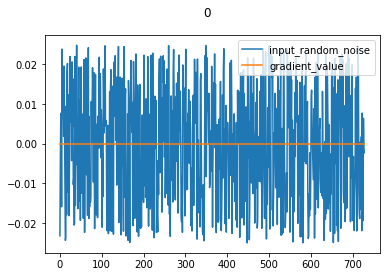

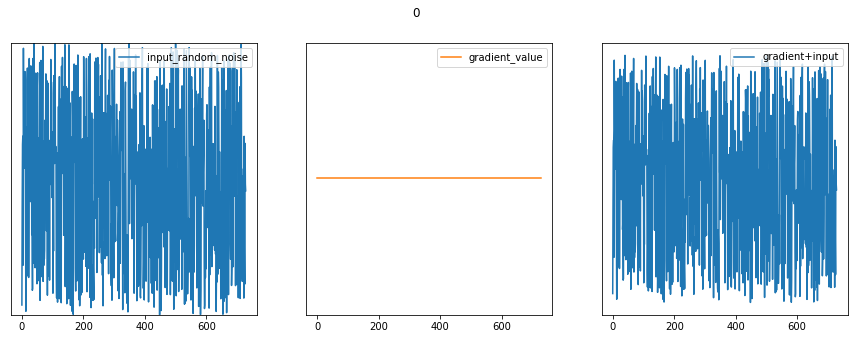

0.0
1


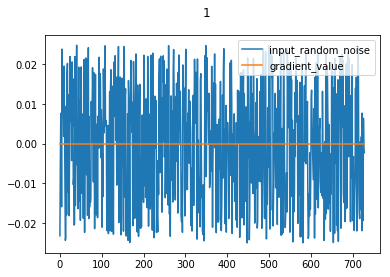

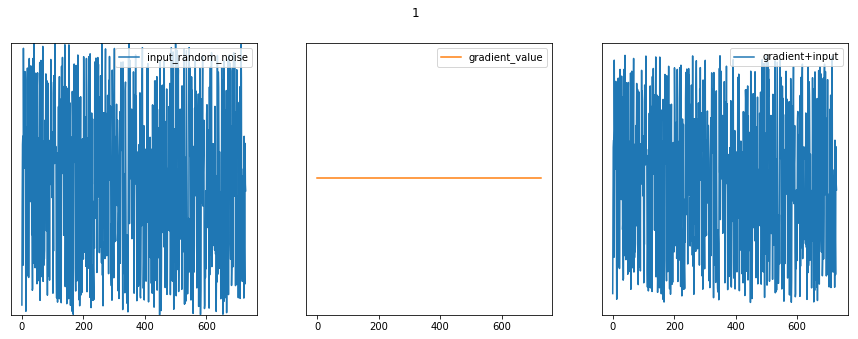

0.0
2


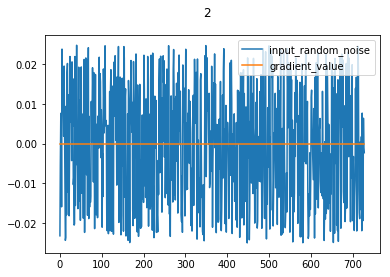

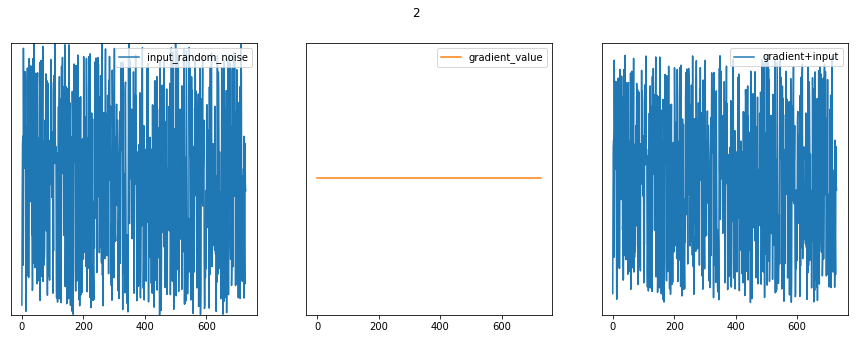

0.0
3


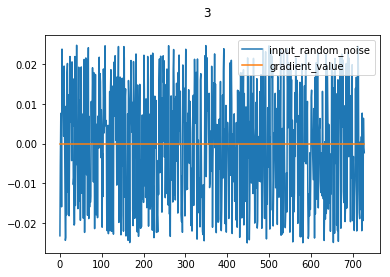

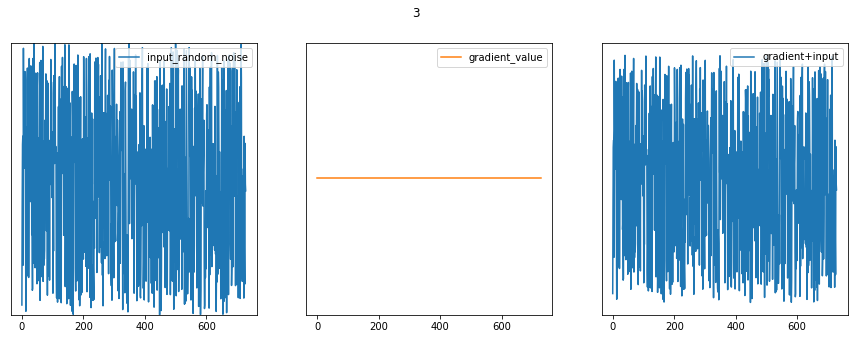

0.0
4


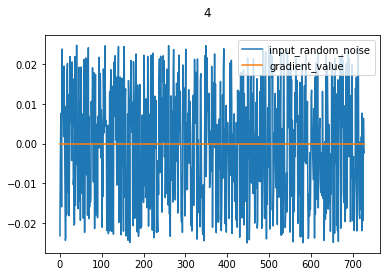

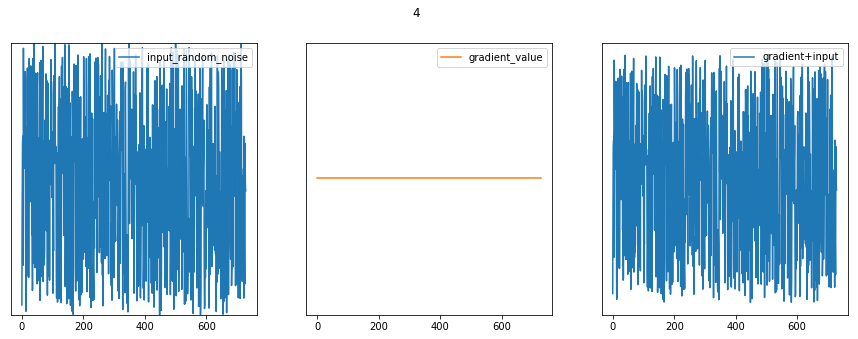

0.0
5


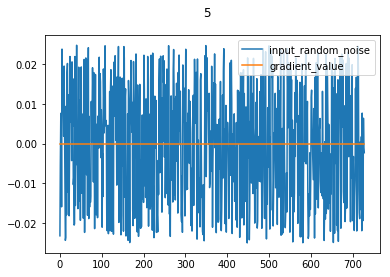

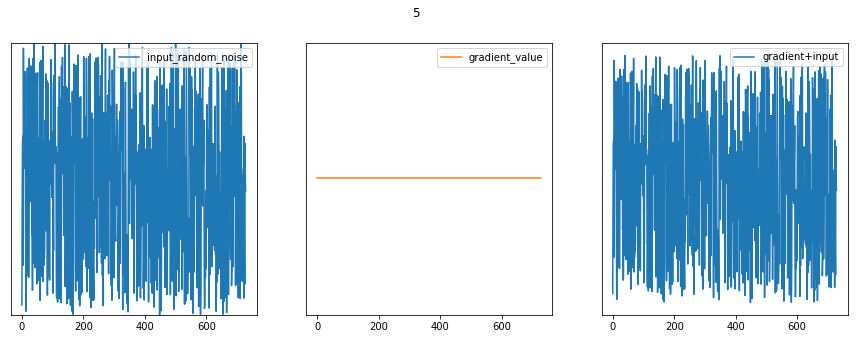

0.0
6


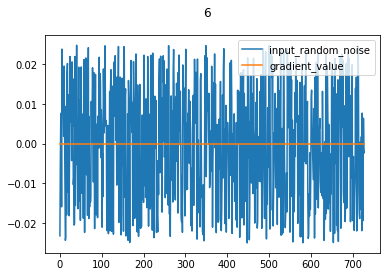

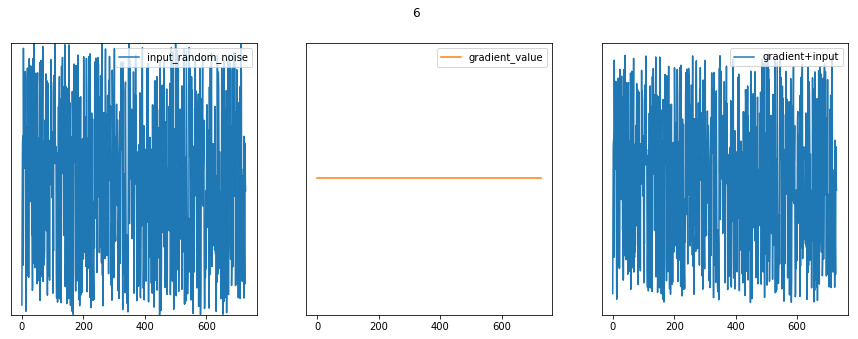

0.0
7


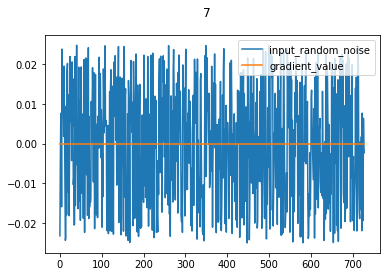

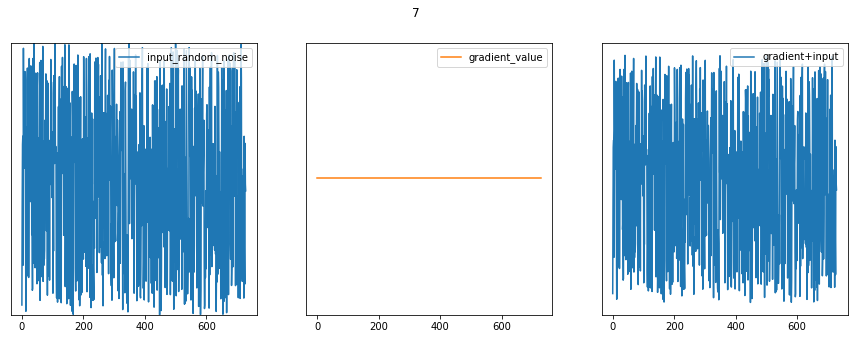

0.0
8


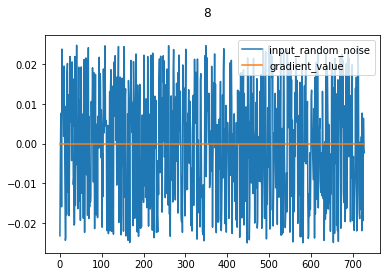

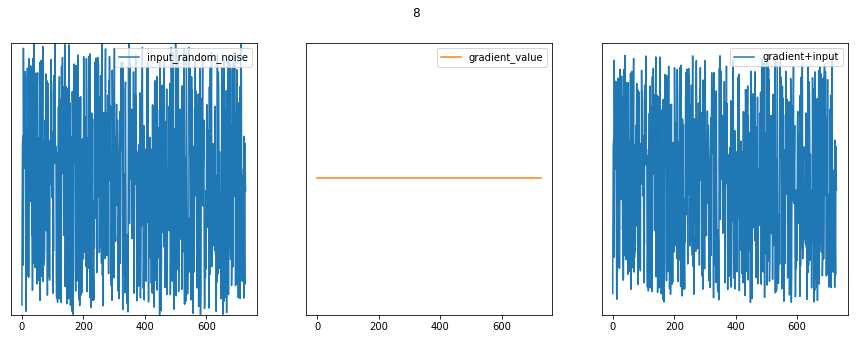

0.0
9


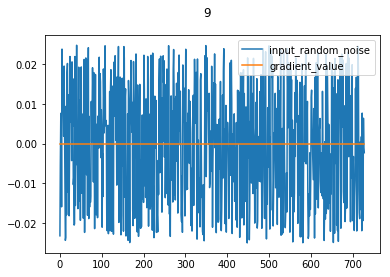

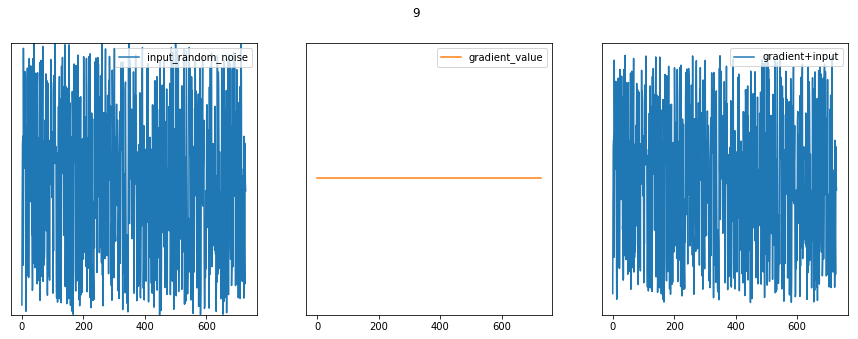

0.0
10


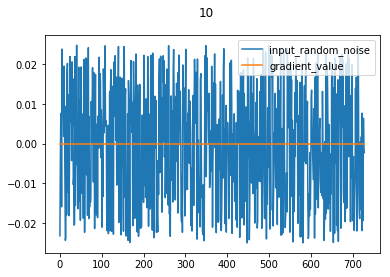

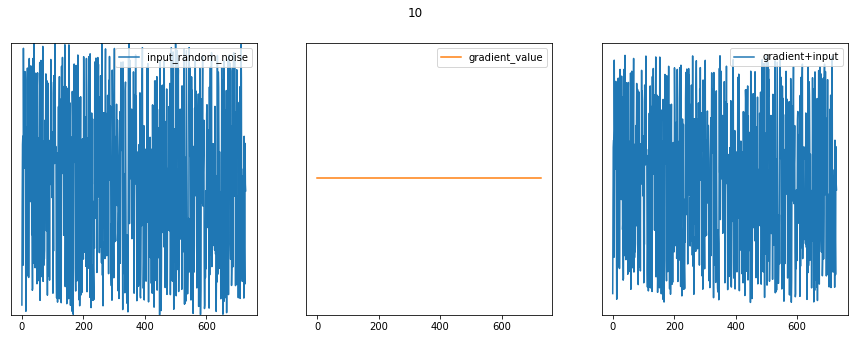

0.0
11


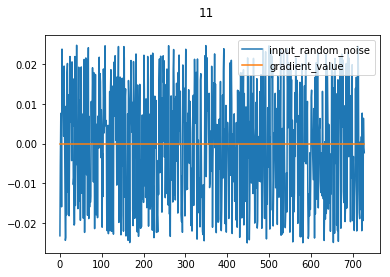

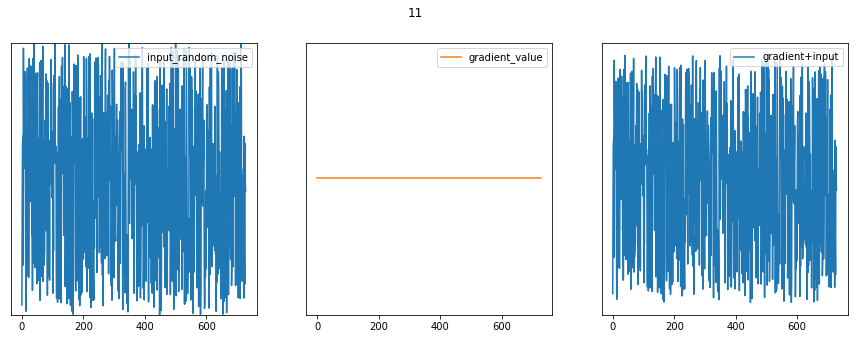

0.0
12


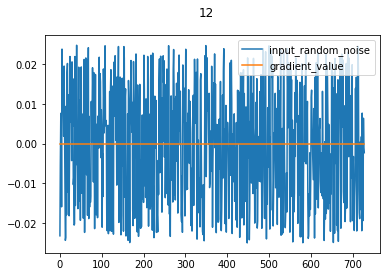

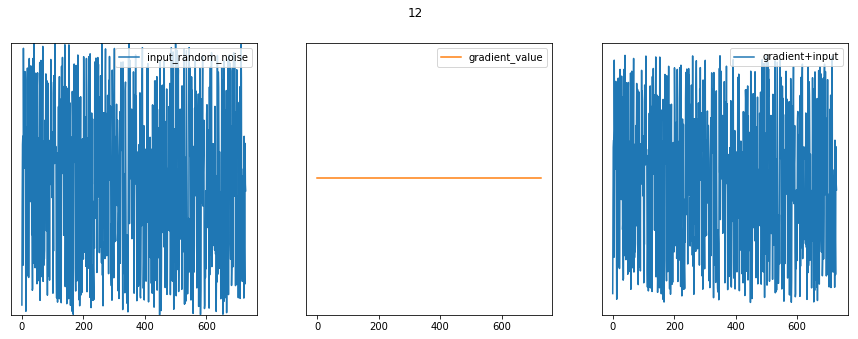

0.0
13


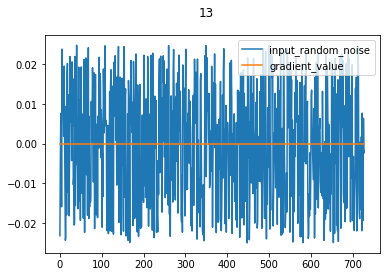

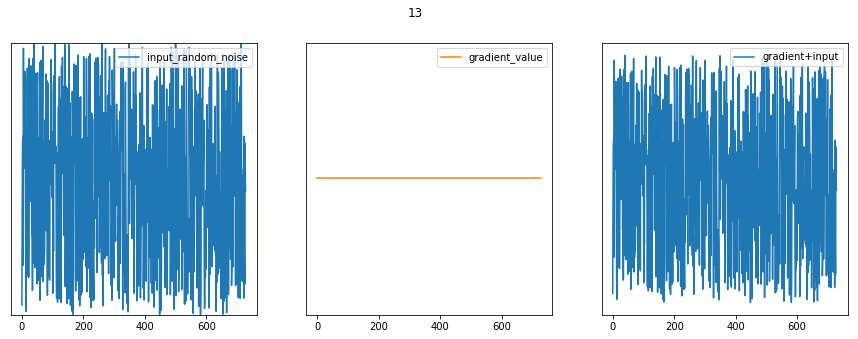

0.0
14


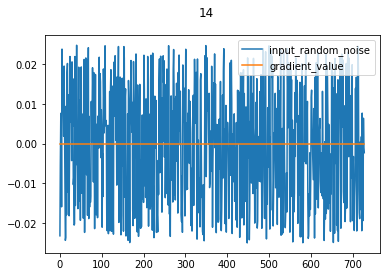

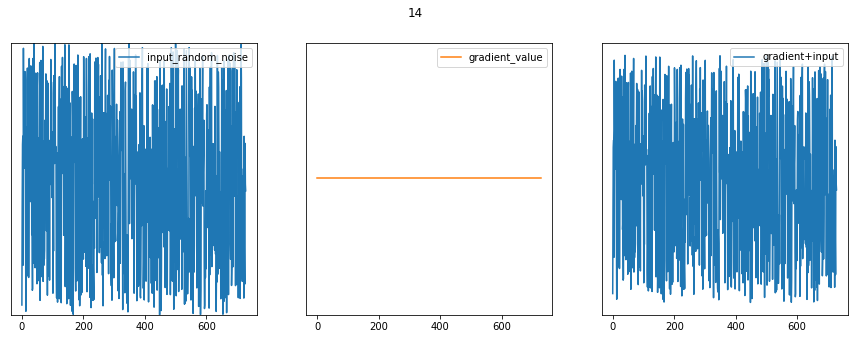

0.0
15


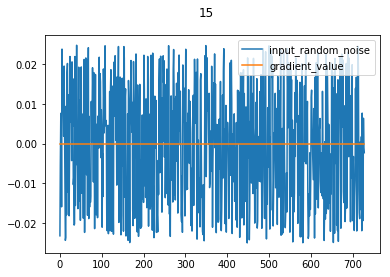

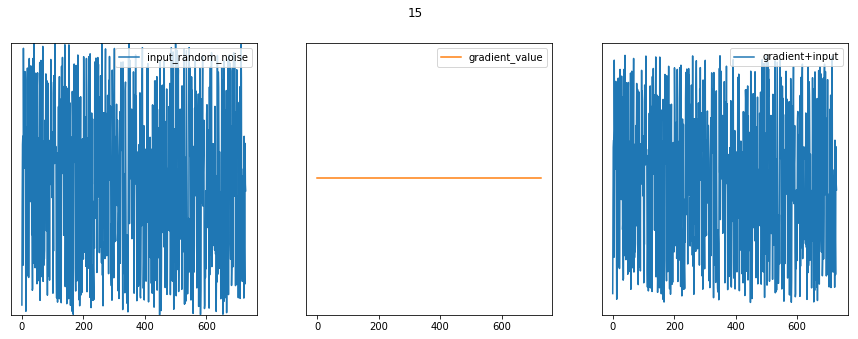

0.0
16


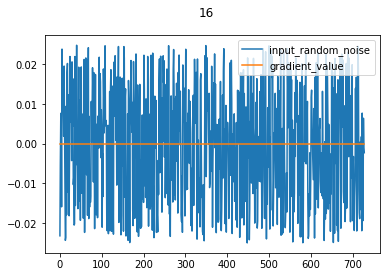

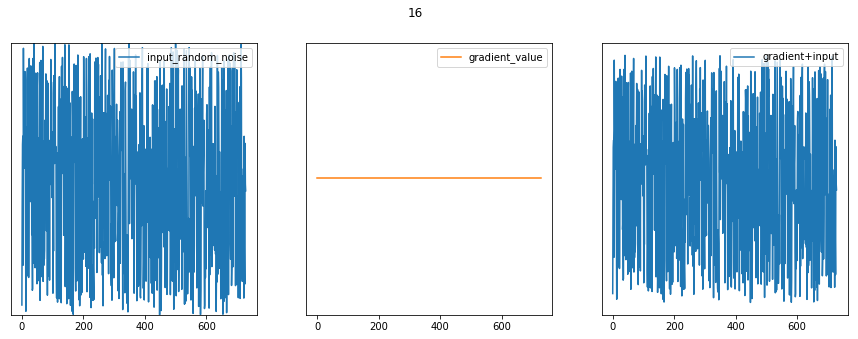

0.0
17


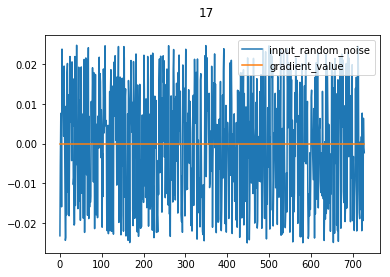

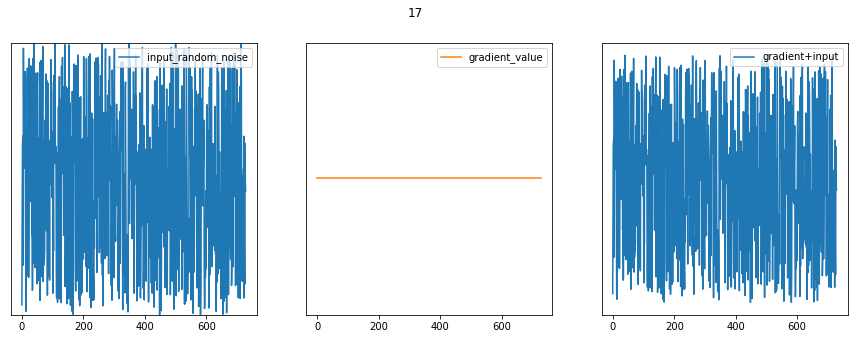

0.0
18


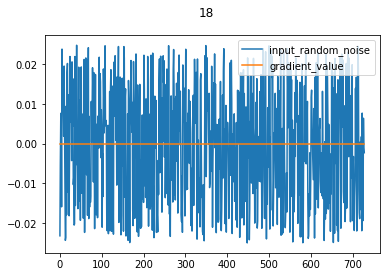

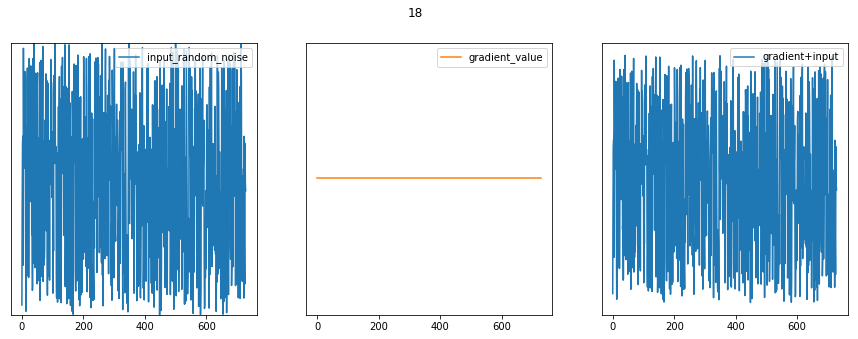

0.0
19


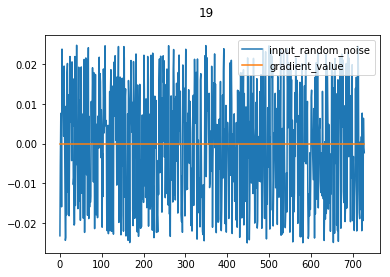

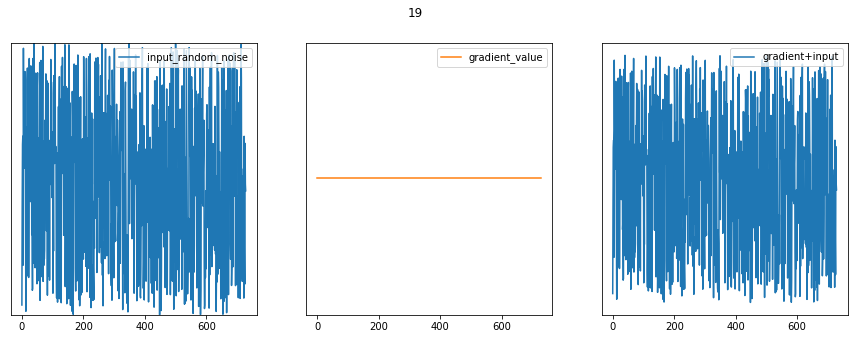

0.0
20


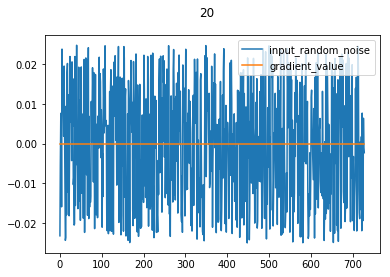

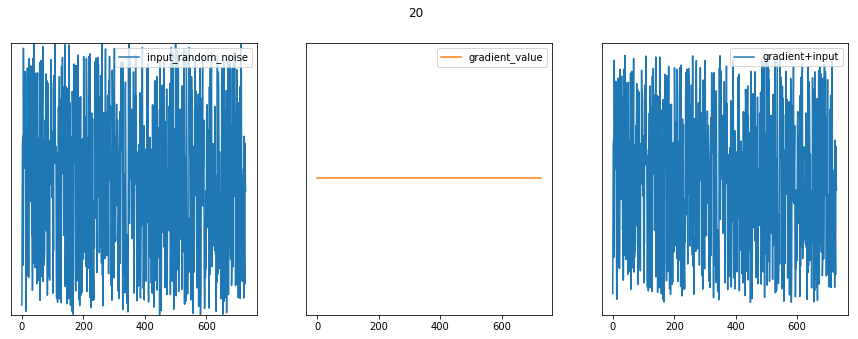

0.0
21


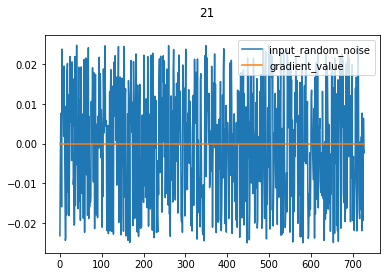

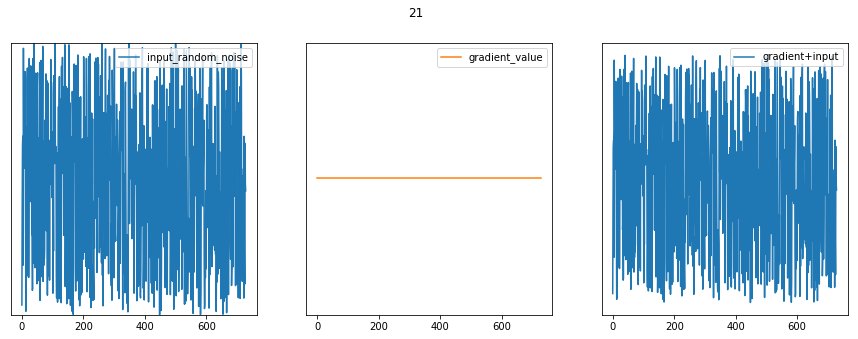

0.0
22


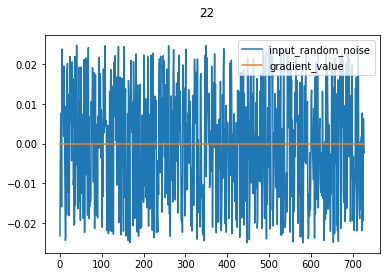

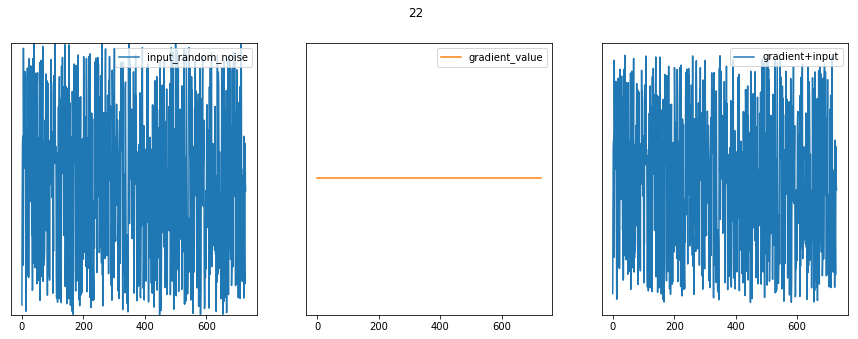

0.0
23


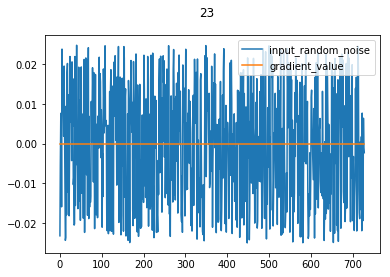

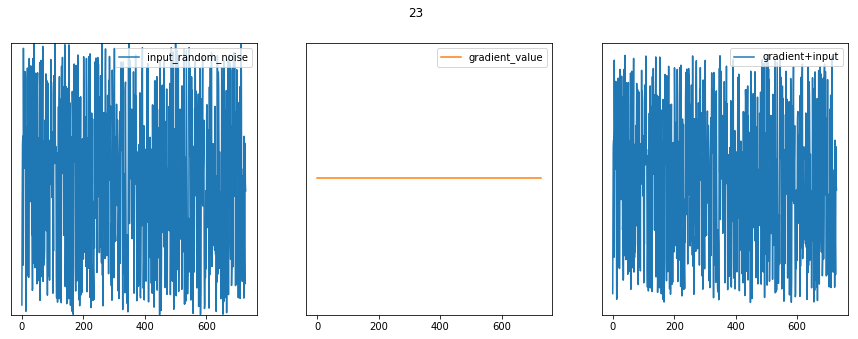

0.0
24


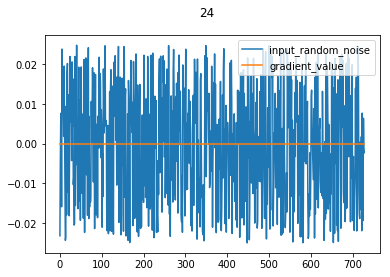

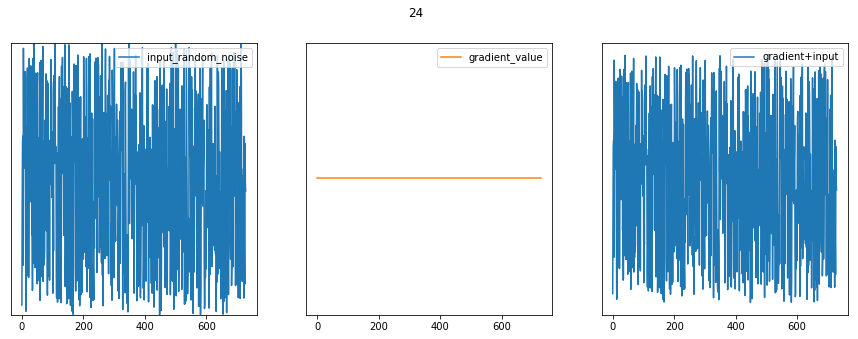

0.0
25


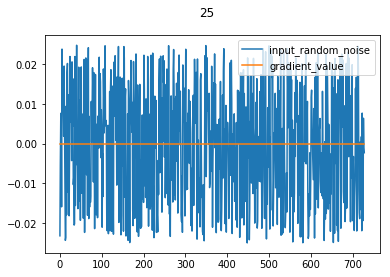

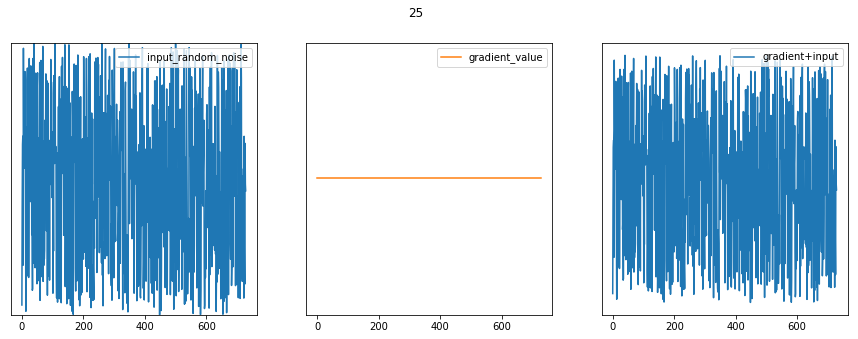

0.0
26


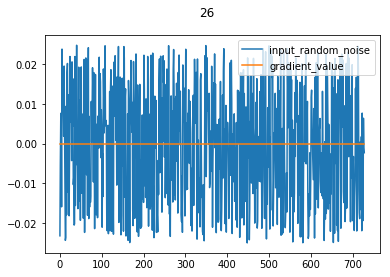

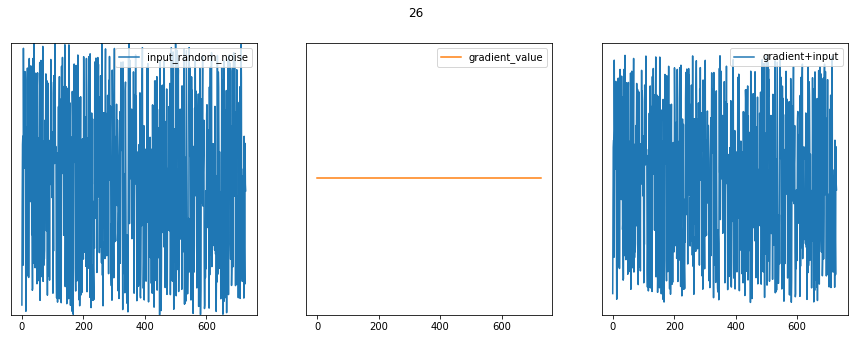

0.0
27


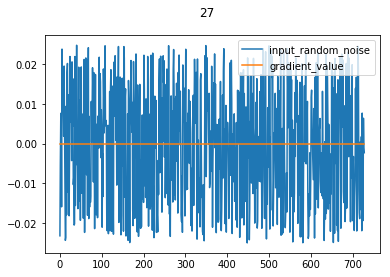

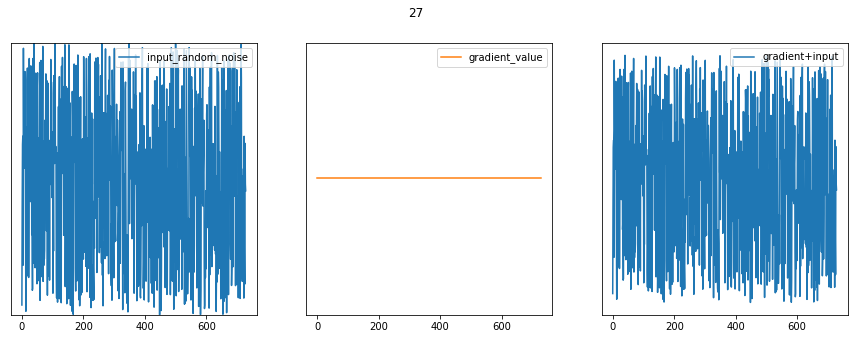

0.0
28


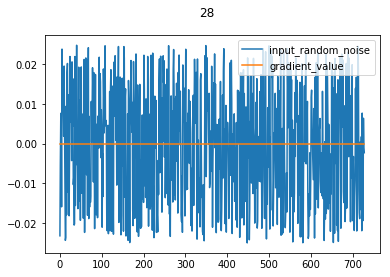

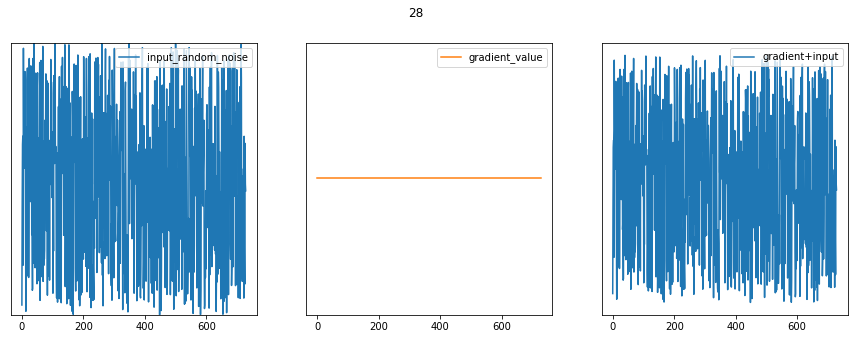

0.0
29


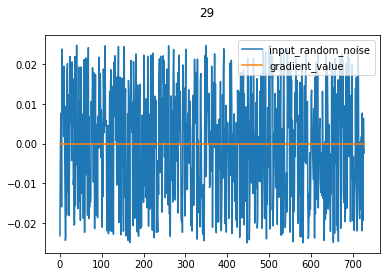

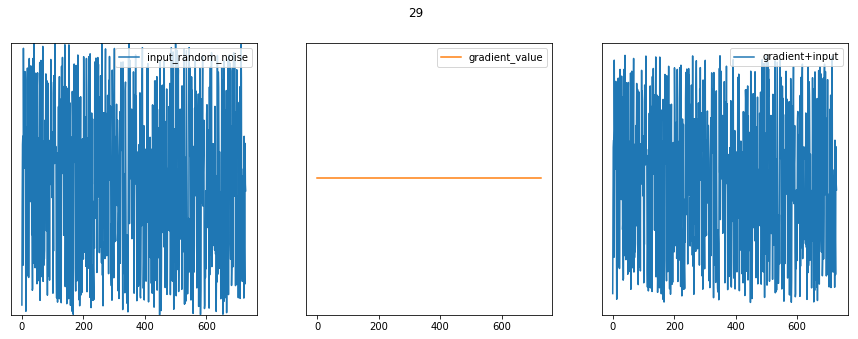

0.0
30


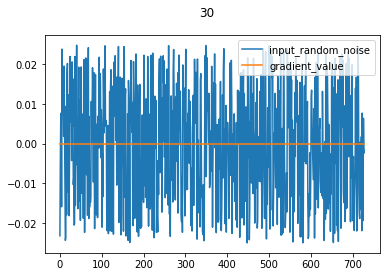

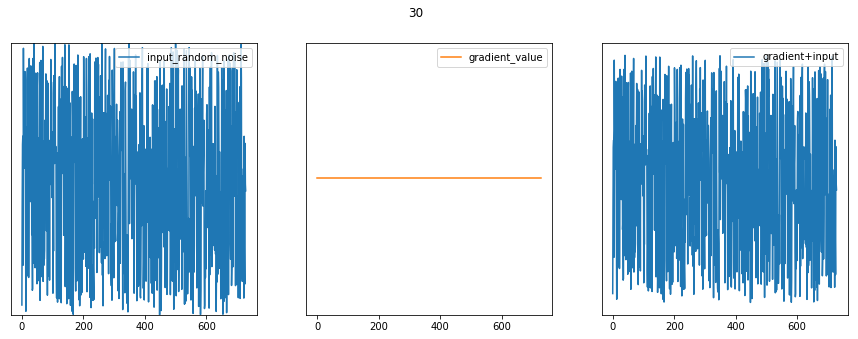

0.0
31


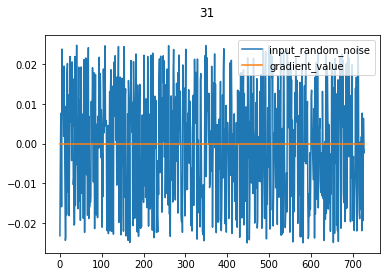

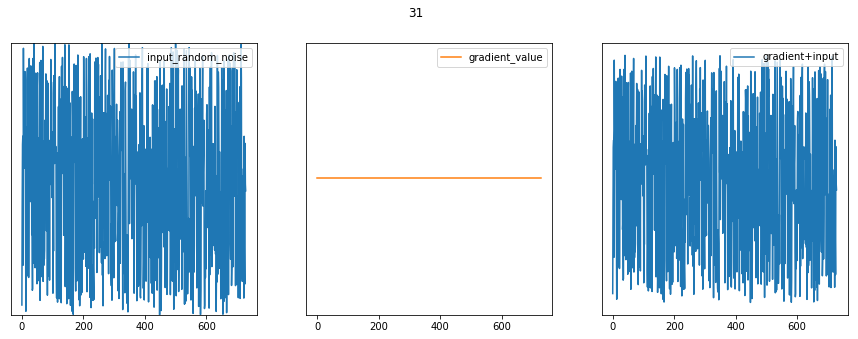

0.0
32


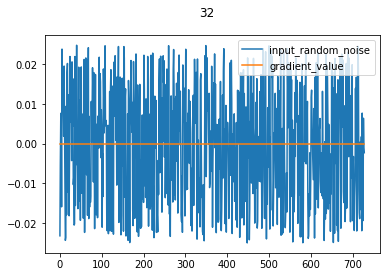

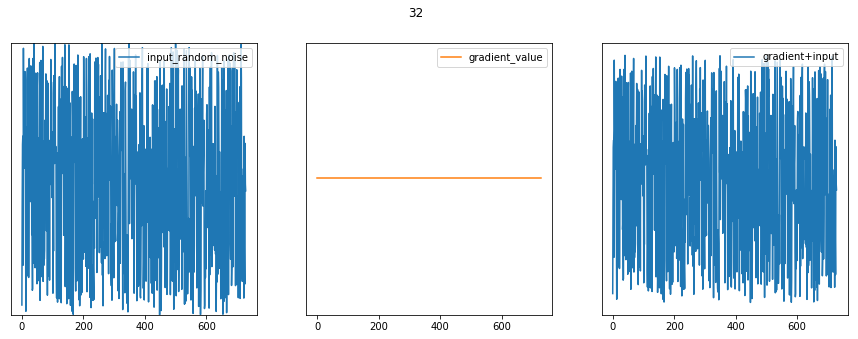

0.0
33


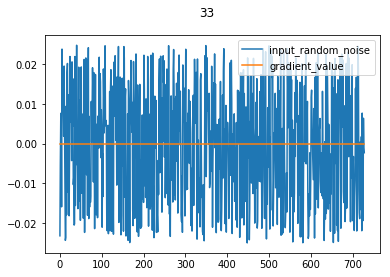

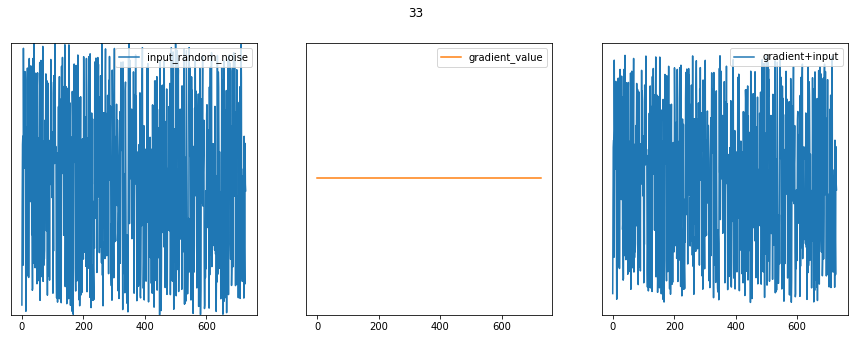

0.0
34


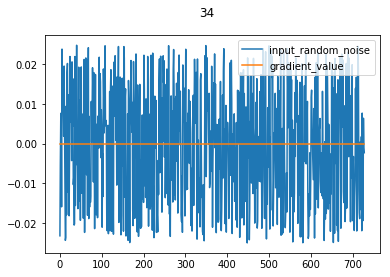

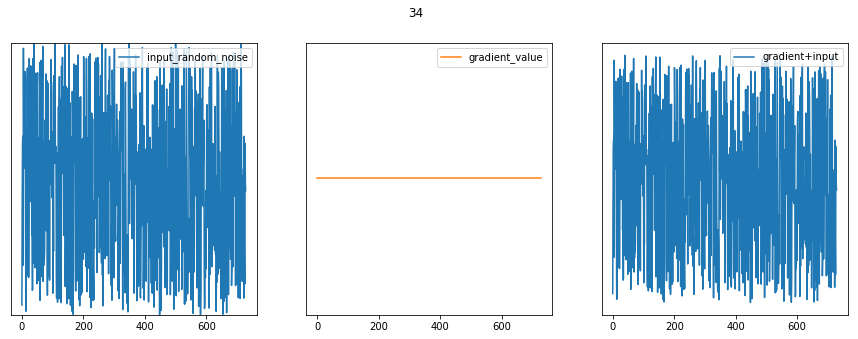

0.0
35


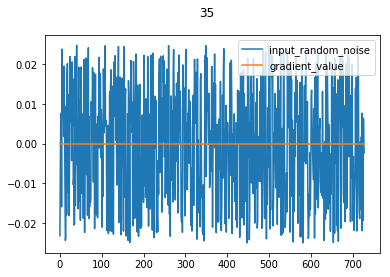

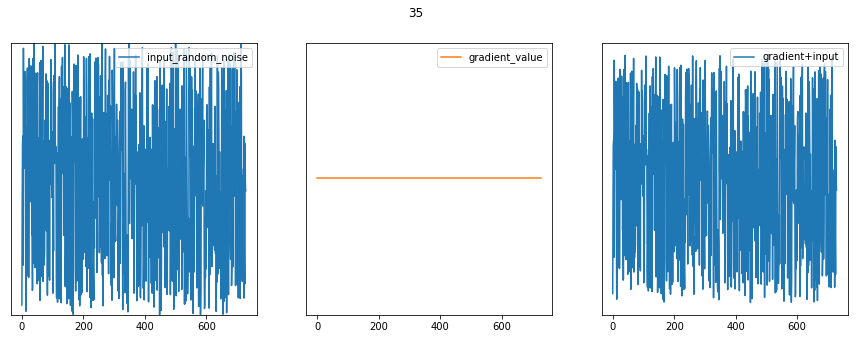

0.0
36


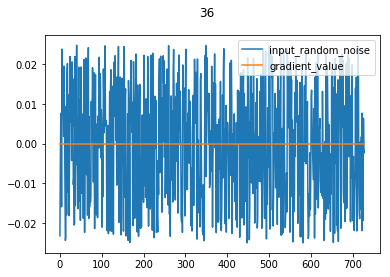

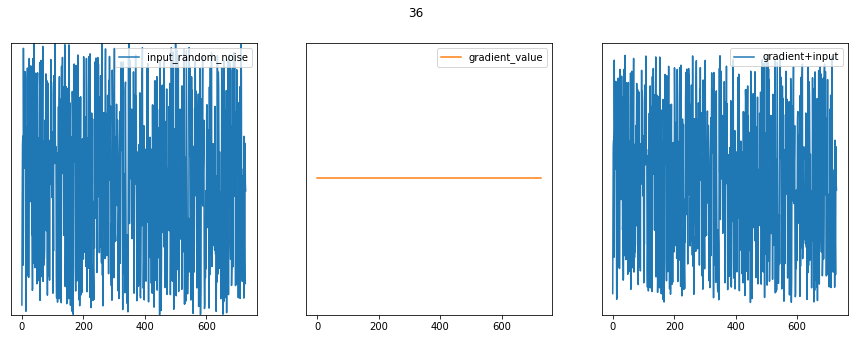

0.0
37


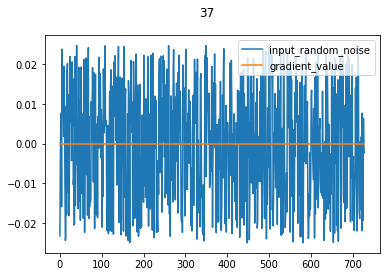

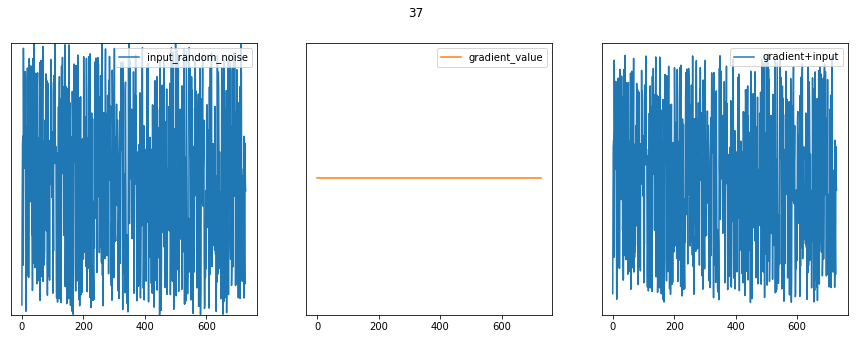

0.0
38


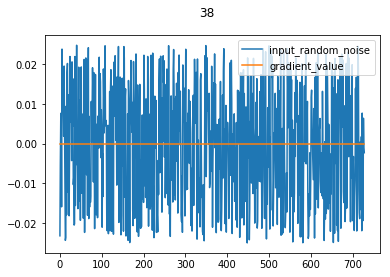

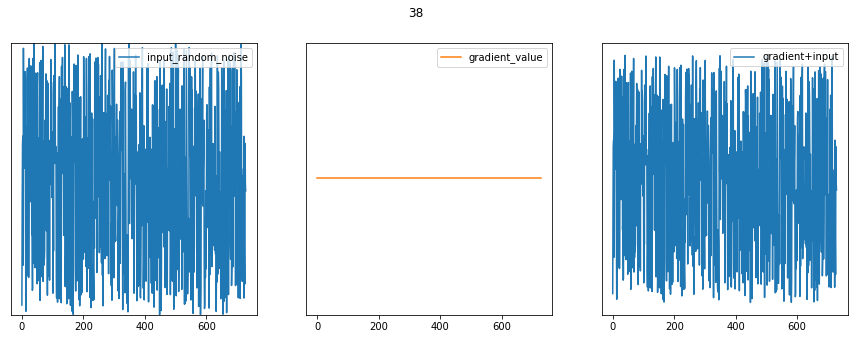

0.0
39


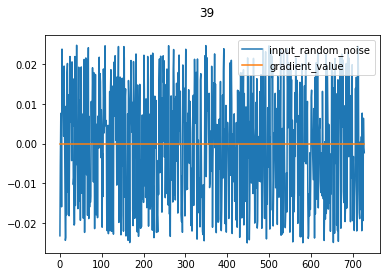

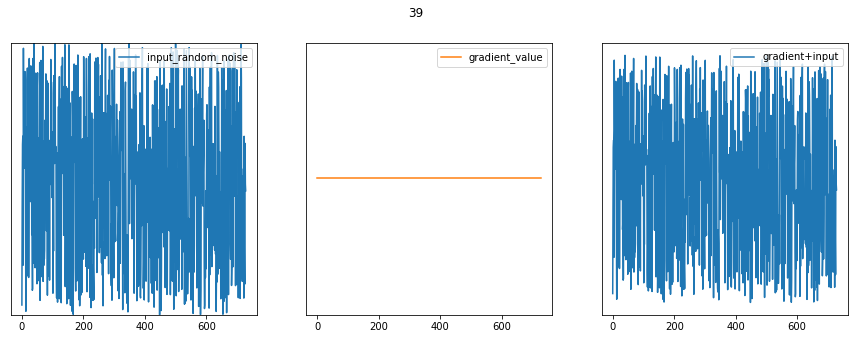

0.0
40


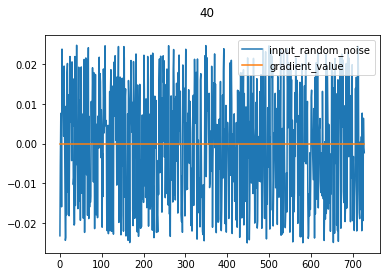

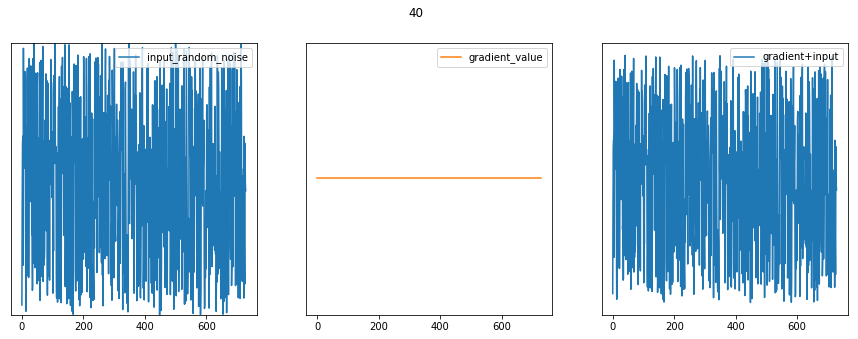

0.0
41


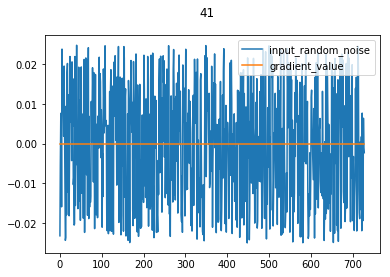

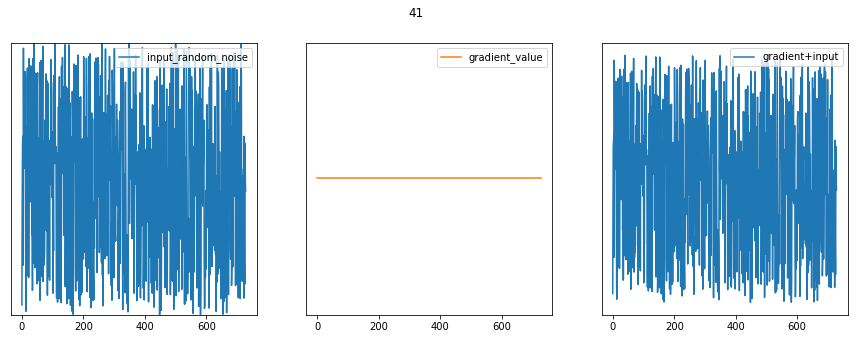

0.0
42


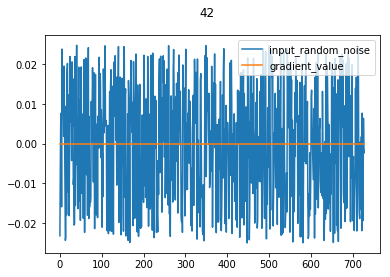

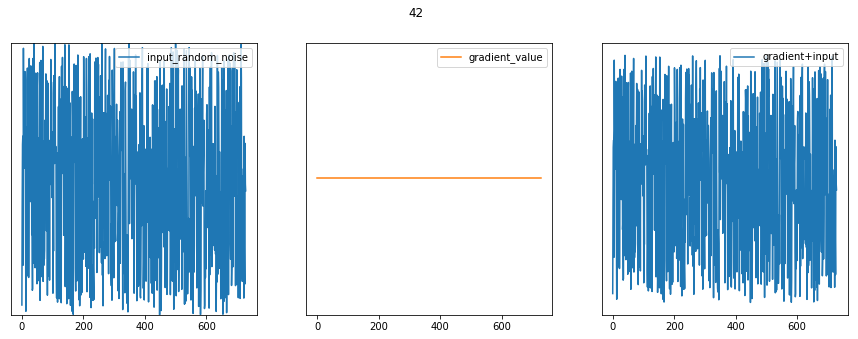

0.0
43


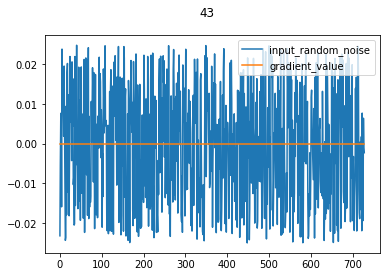

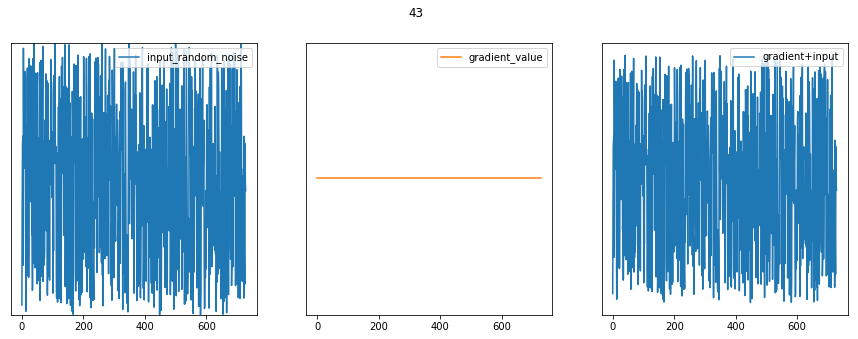

0.0
44


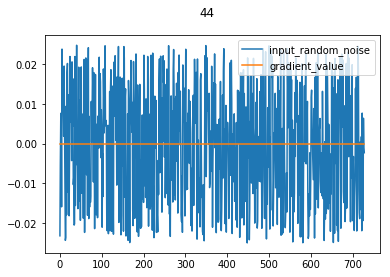

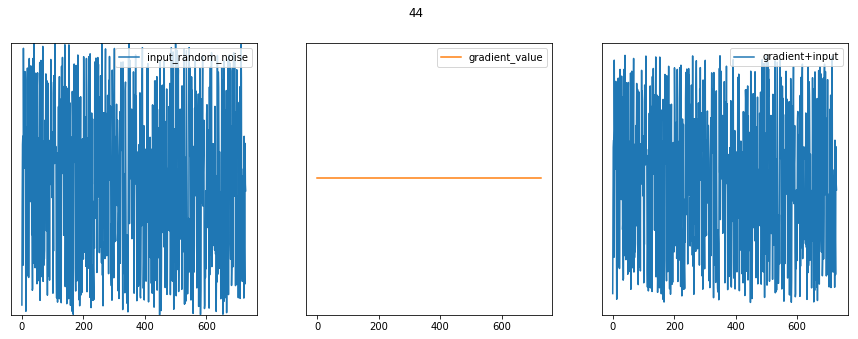

0.0
45


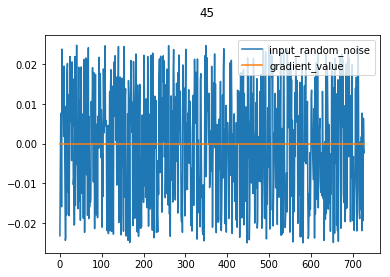

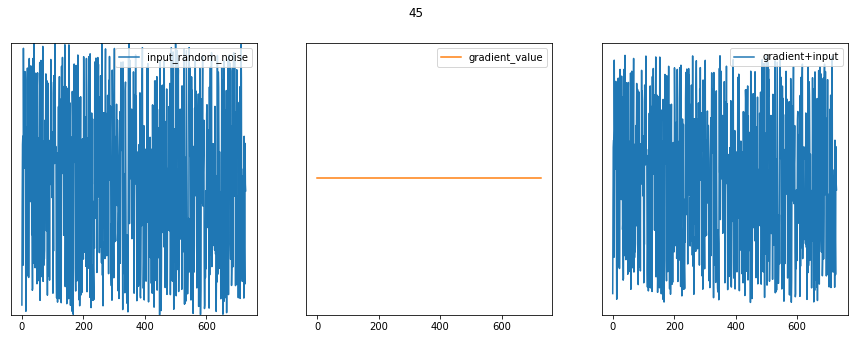

0.0
46


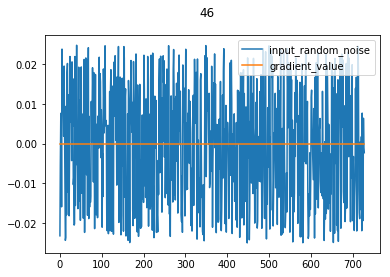

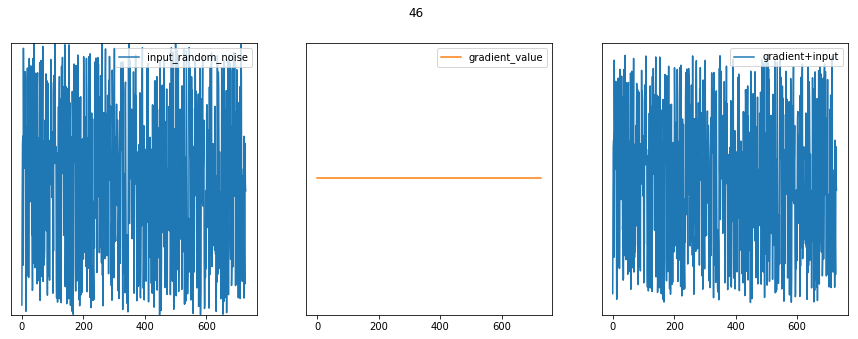

0.0
47


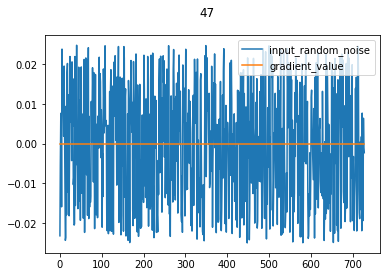

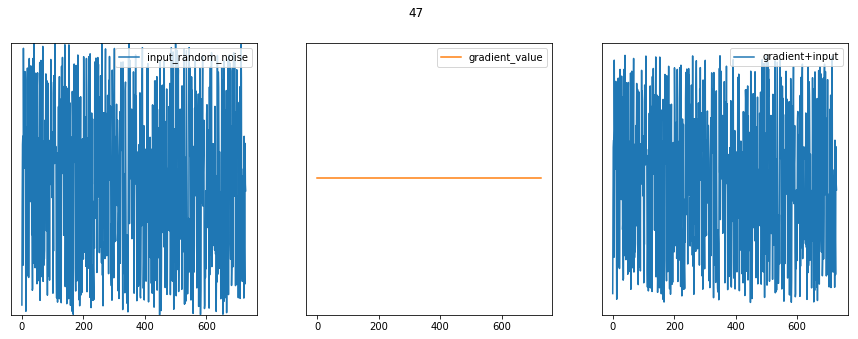

0.0
48


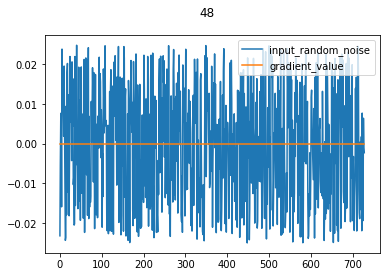

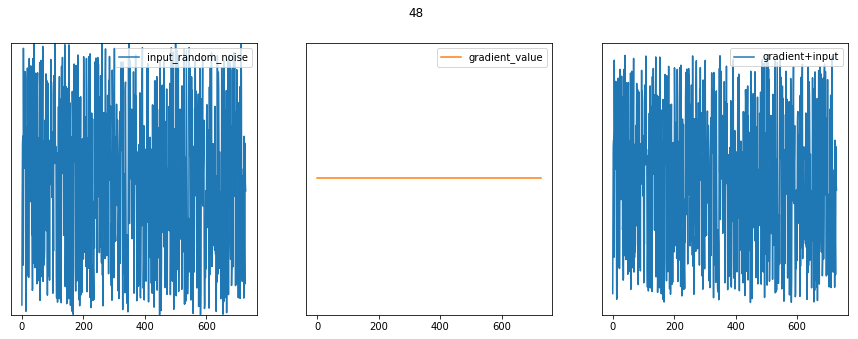

0.0
49


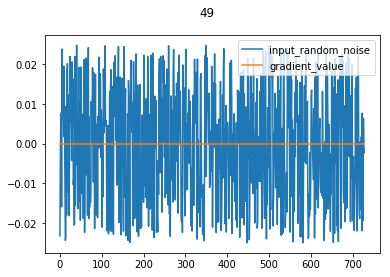

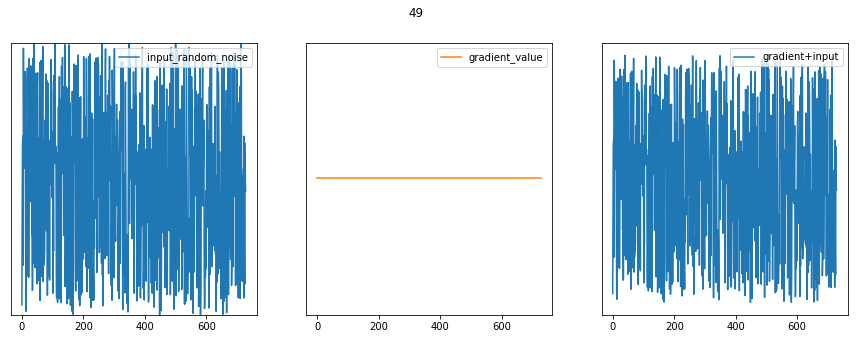

0.0
50


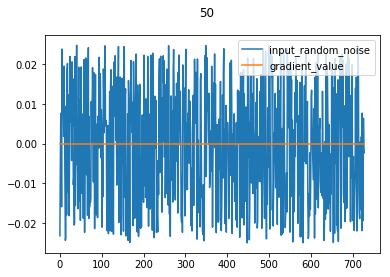

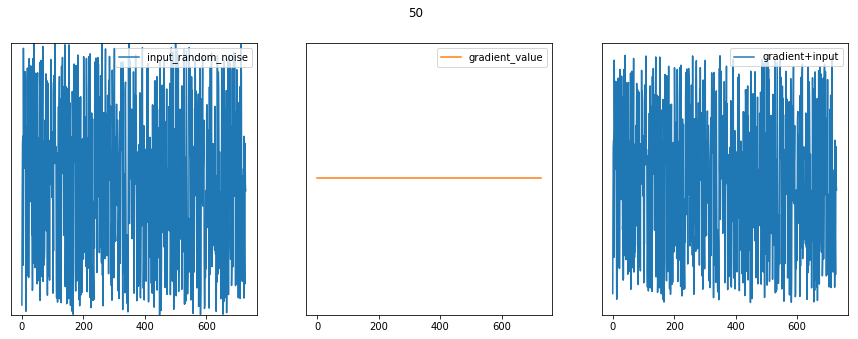

0.0
51


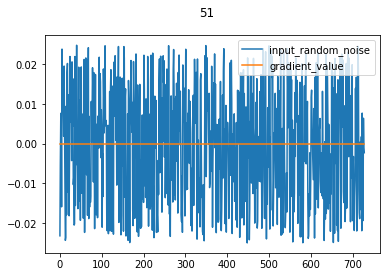

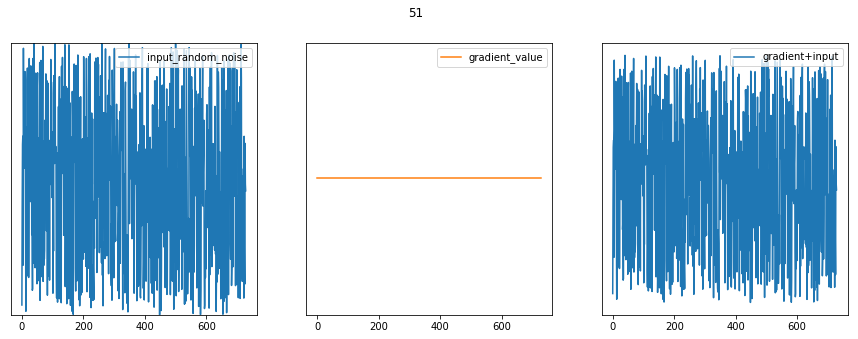

0.0
52


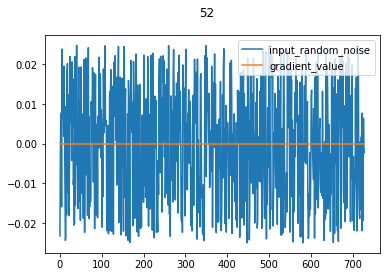

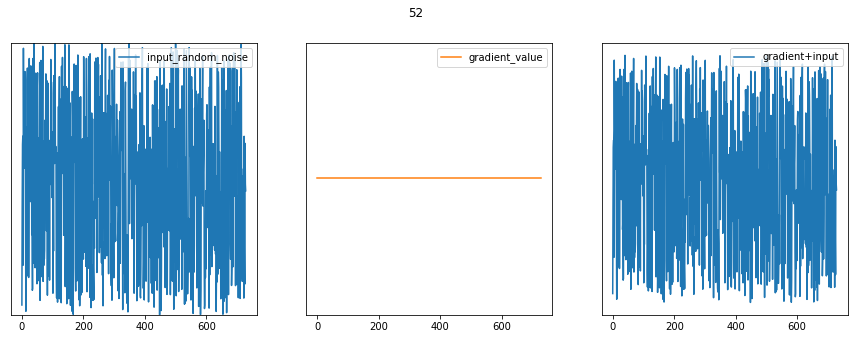

0.0
53


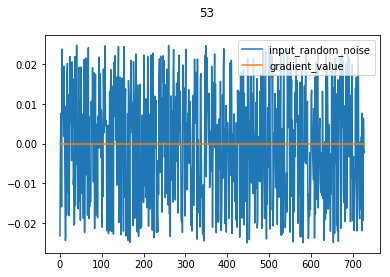

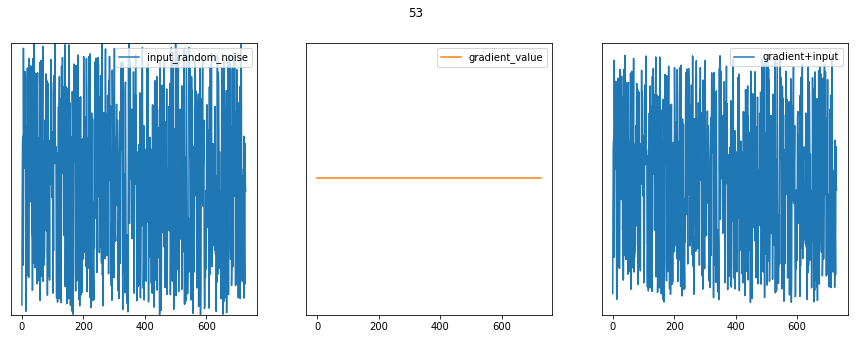

0.0
54


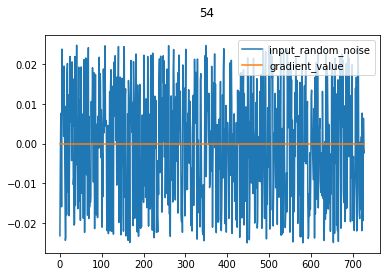

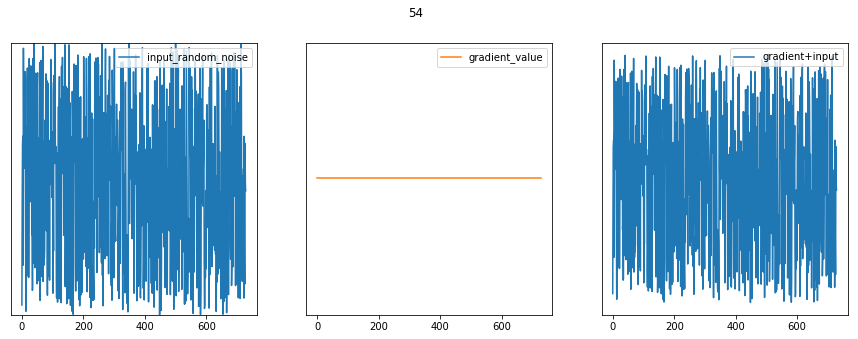

0.0
55


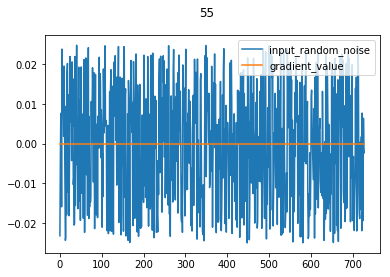

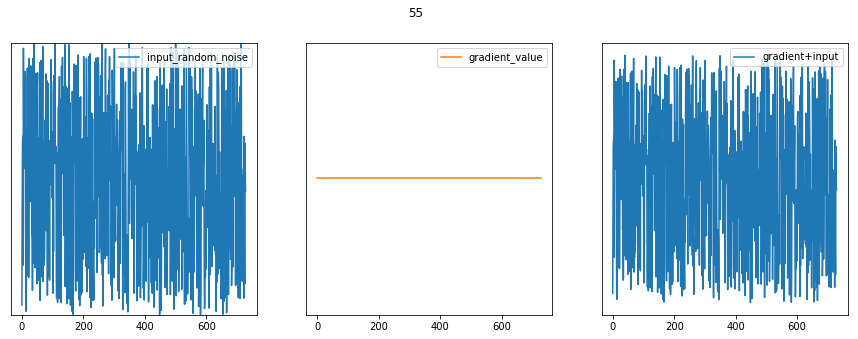

0.0
56


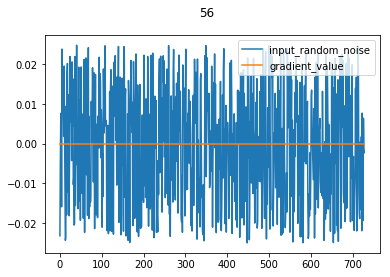

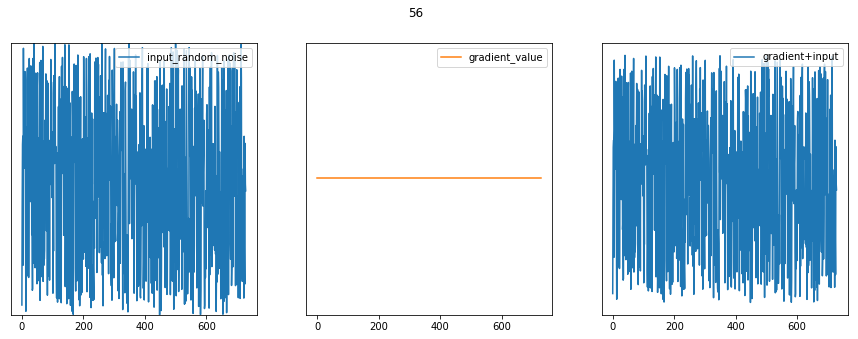

0.0
57


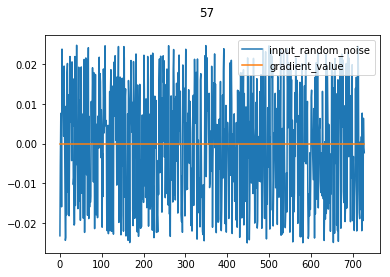

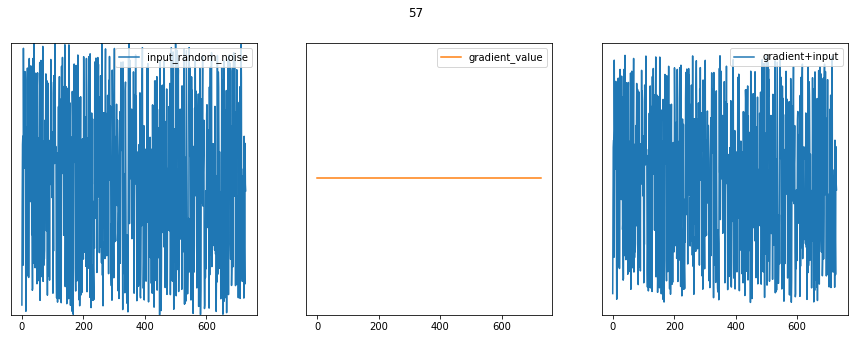

0.0
58


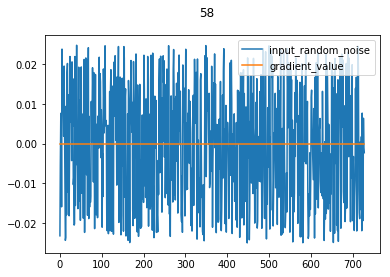

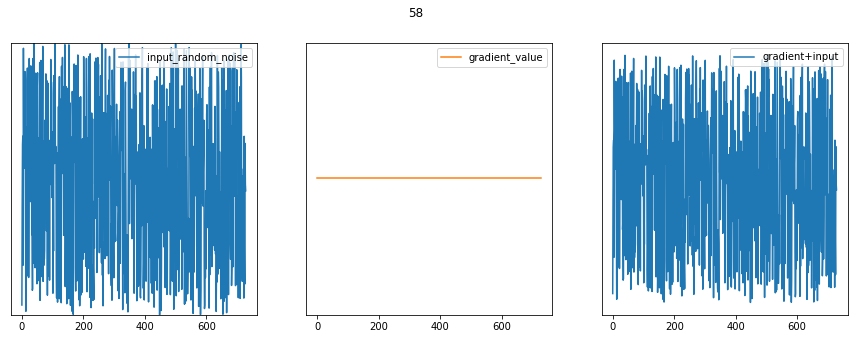

0.0
59


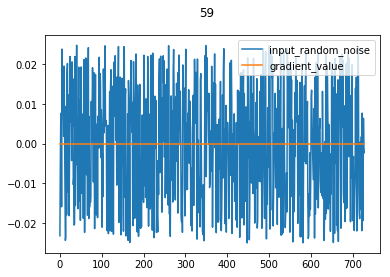

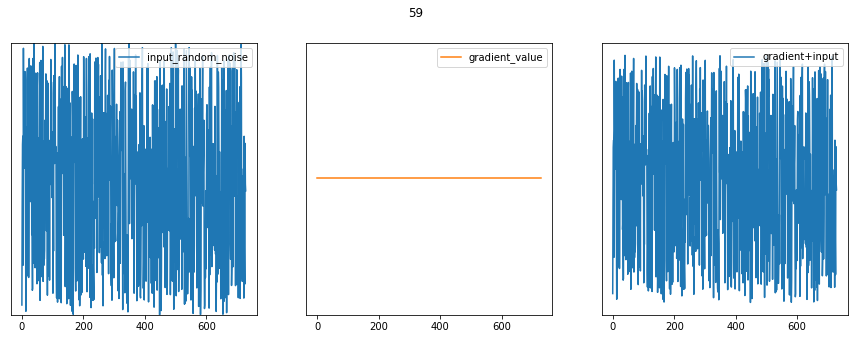

0.0
60


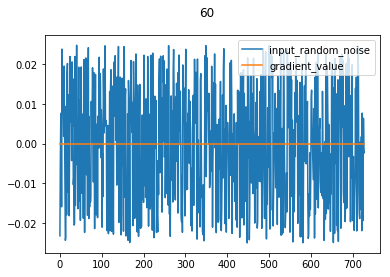

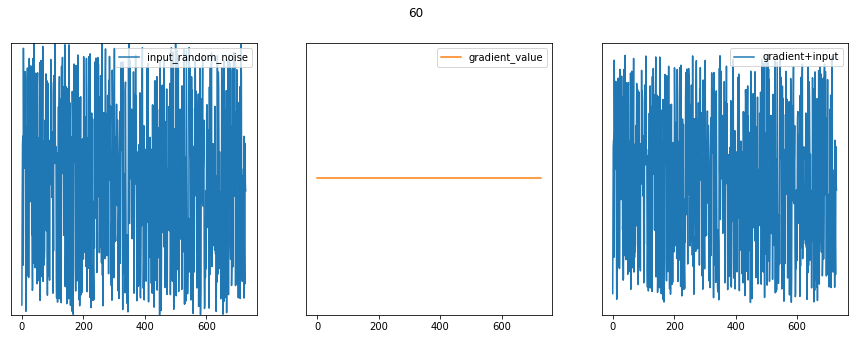

0.0
61


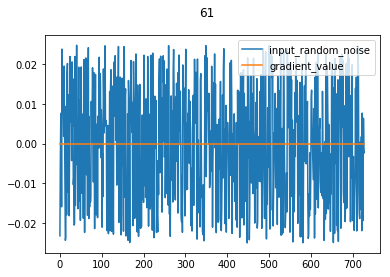

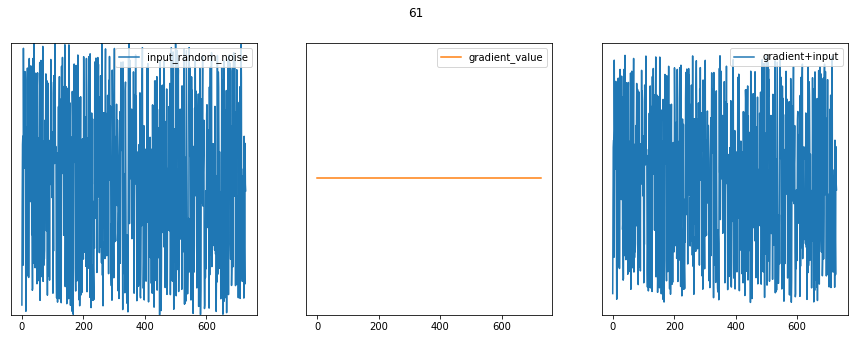

0.0
62


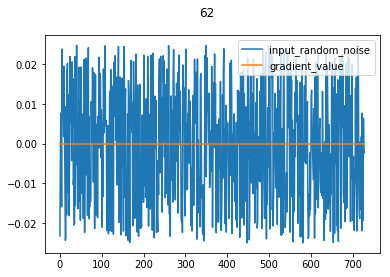

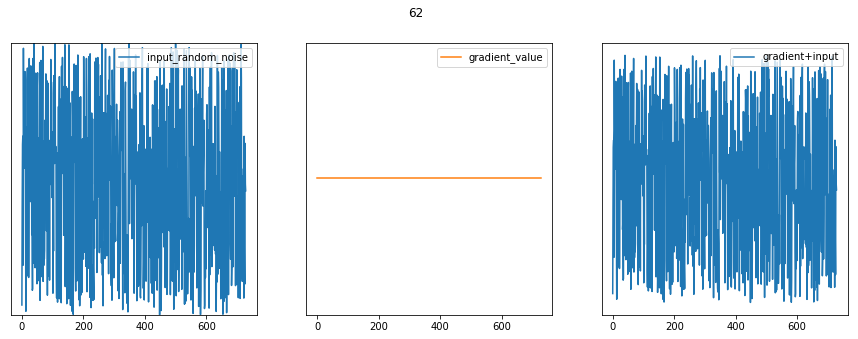

0.0
63


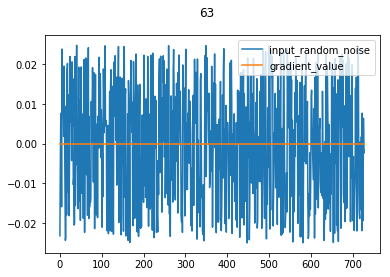

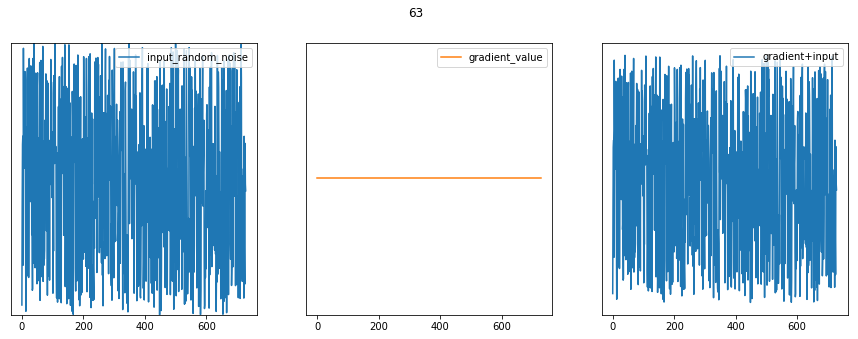

0.0
64


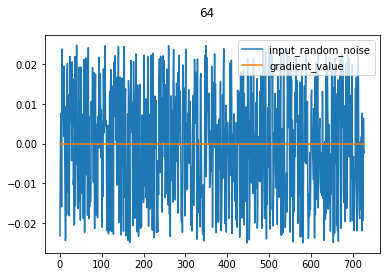

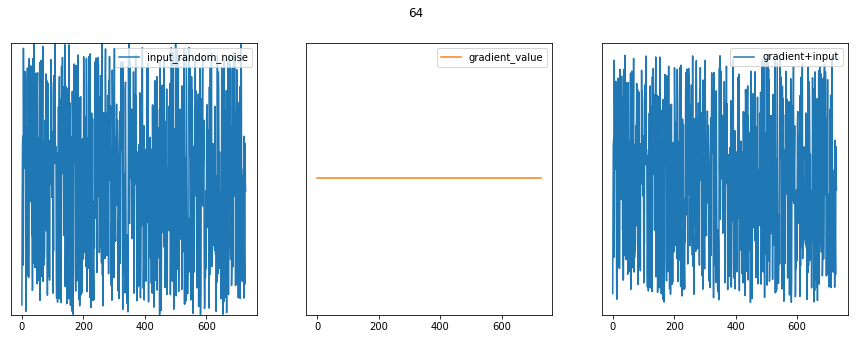

0.0
65


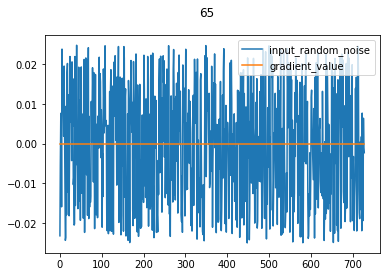

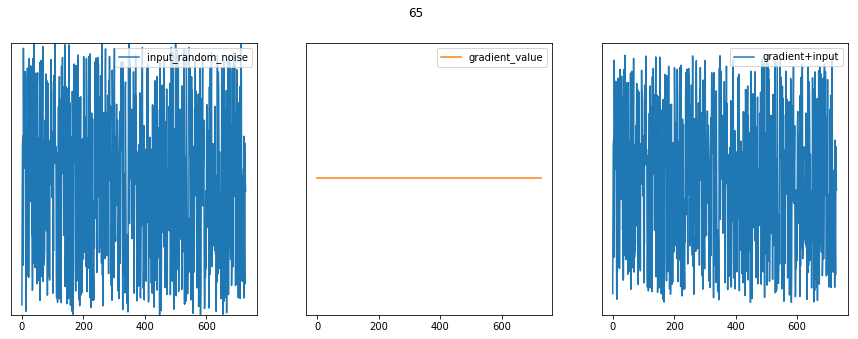

0.0
66


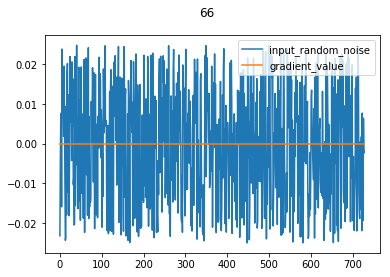

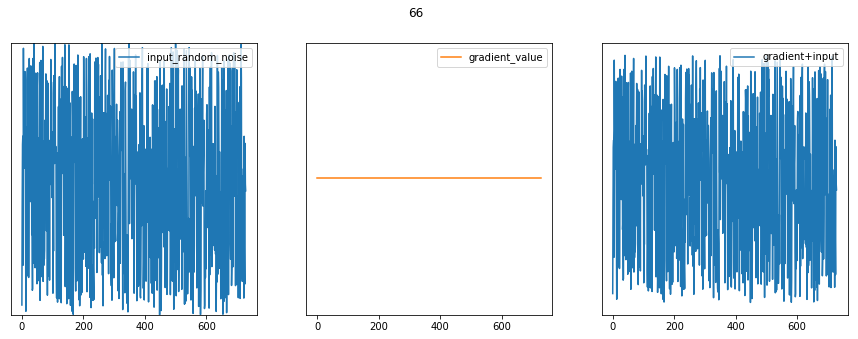

0.0
67


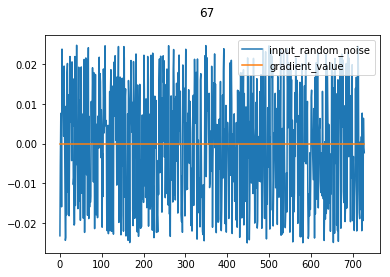

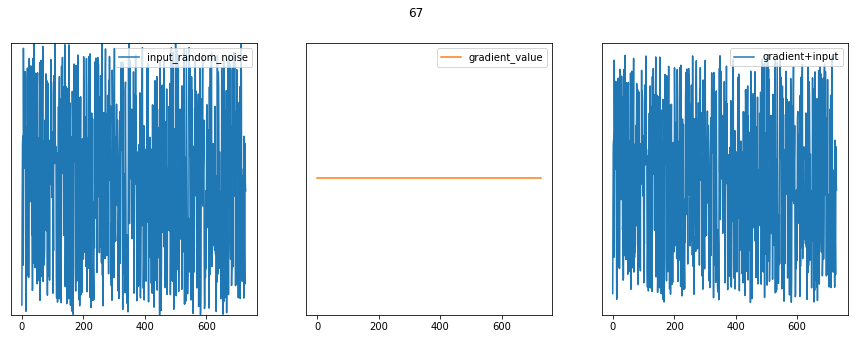

0.0
68


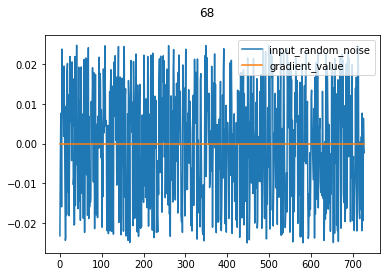

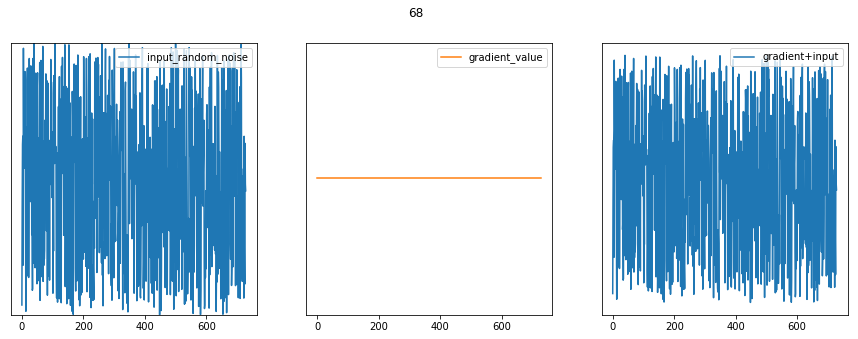

0.0
69


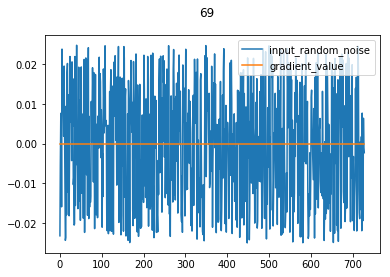

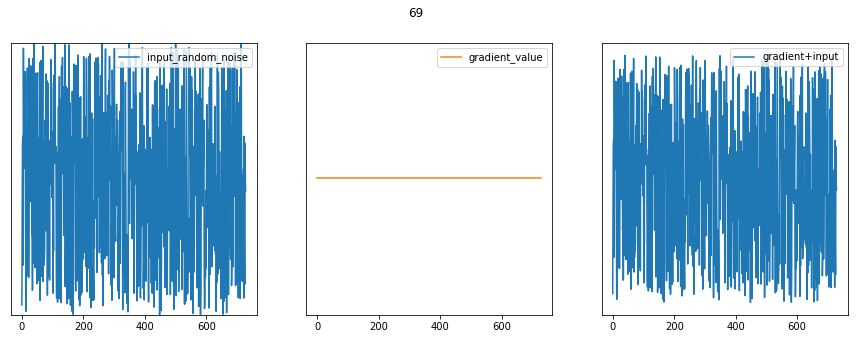

0.0
70


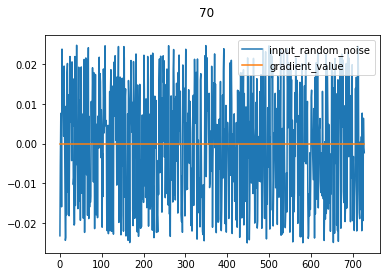

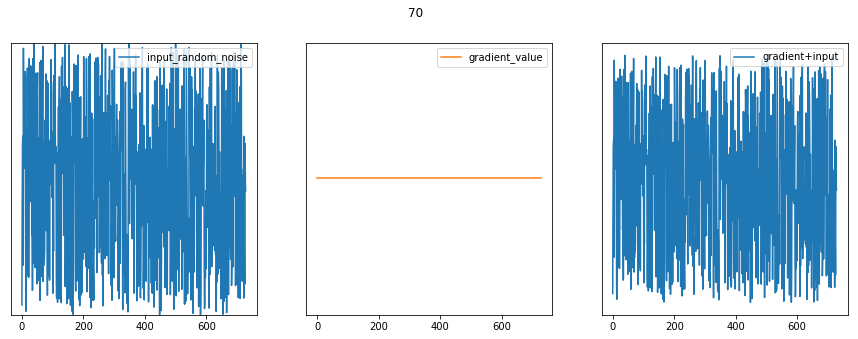

0.0
71


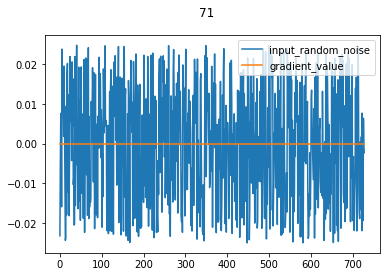

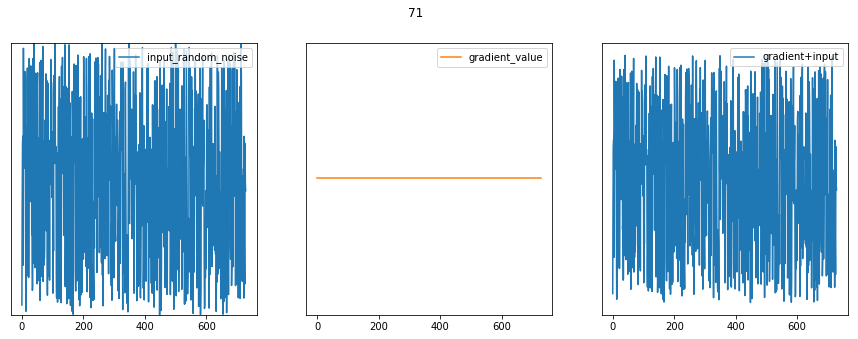

0.0
72


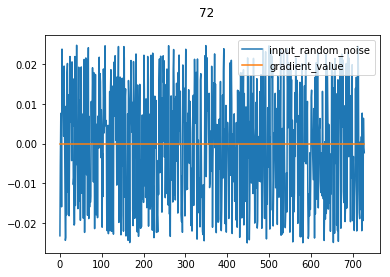

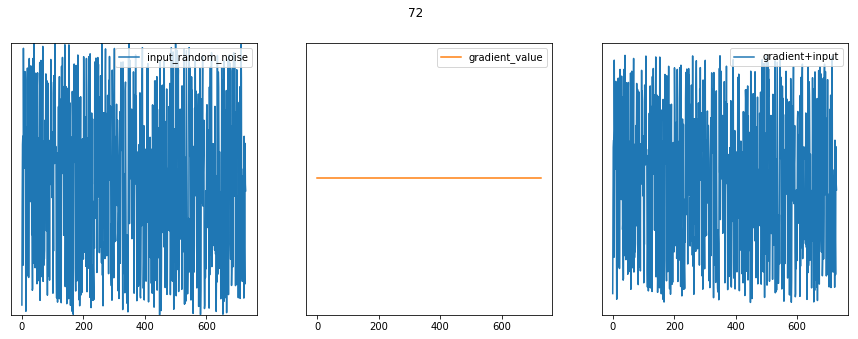

0.0
73


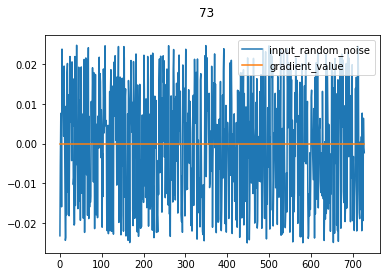

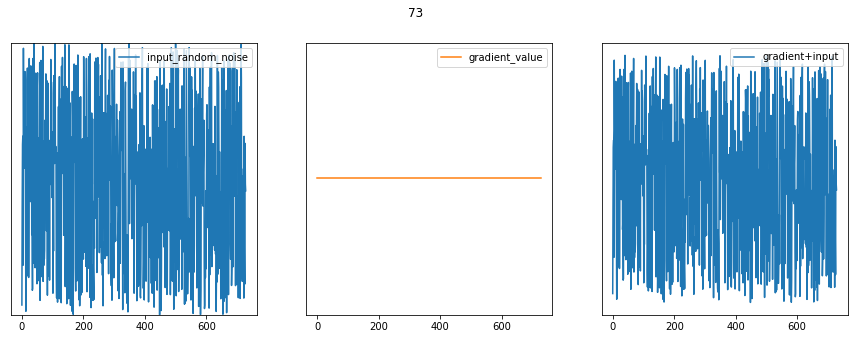

0.0
74


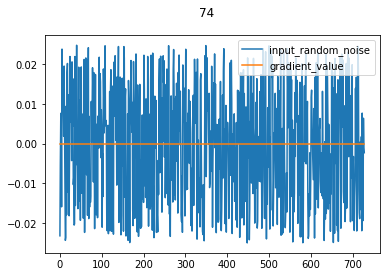

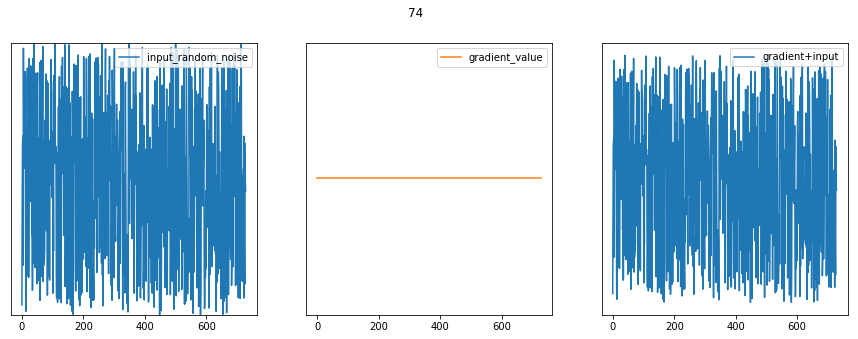

0.0
75


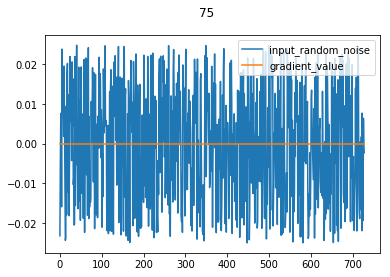

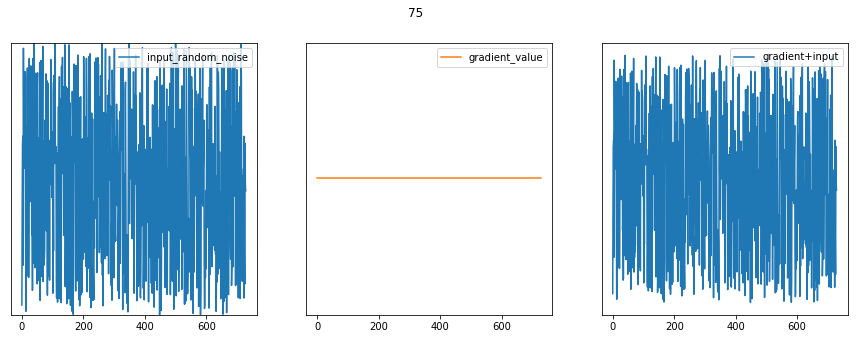

0.0
76


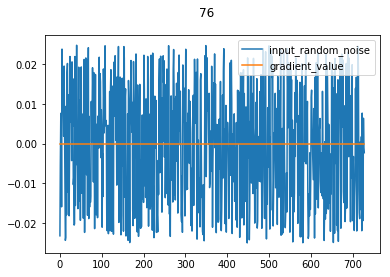

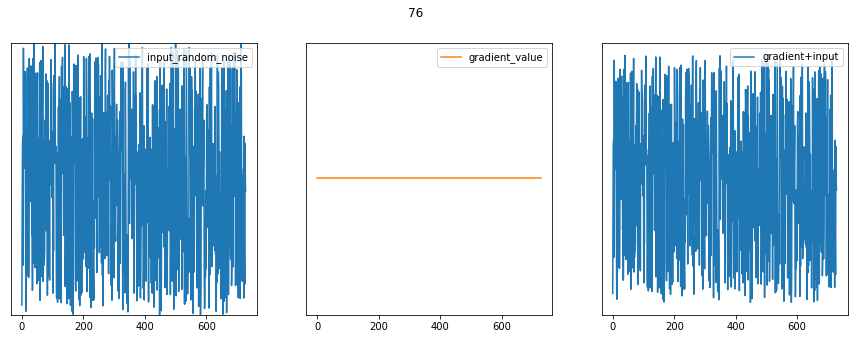

0.0
77


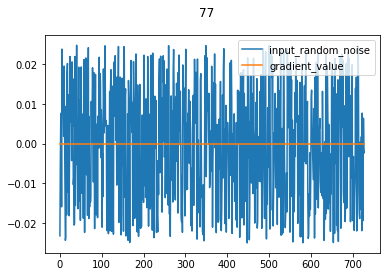

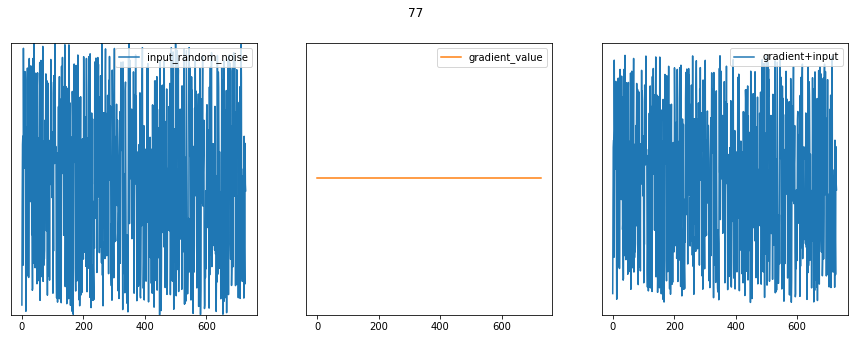

0.0
78


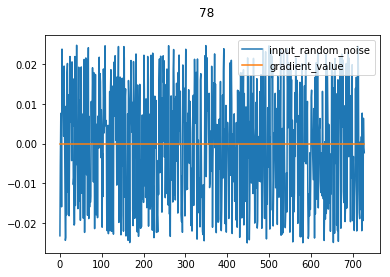

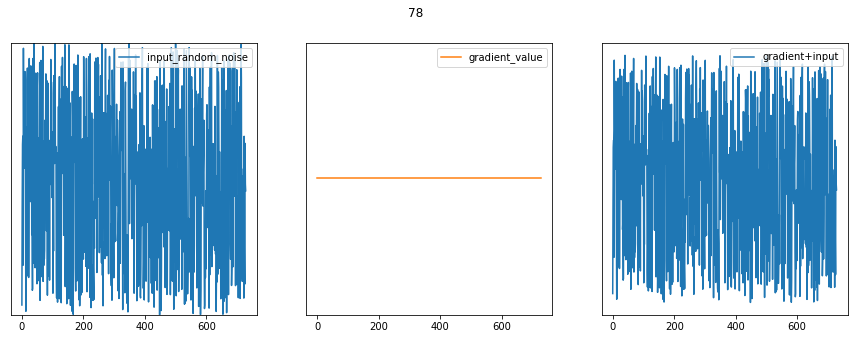

0.0
79


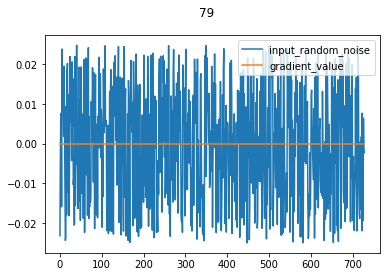

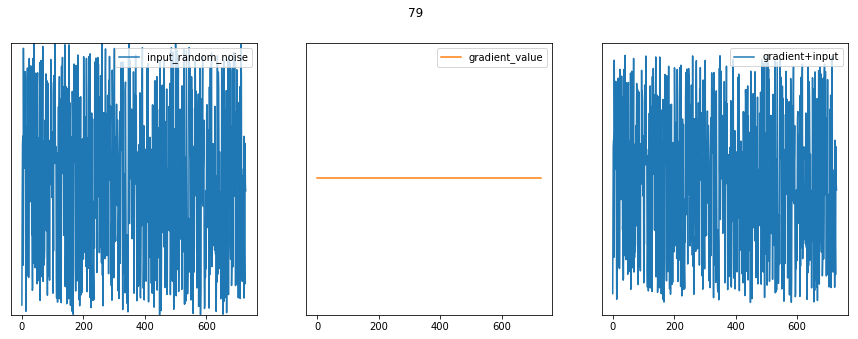

0.0
80


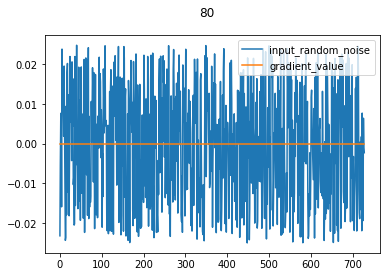

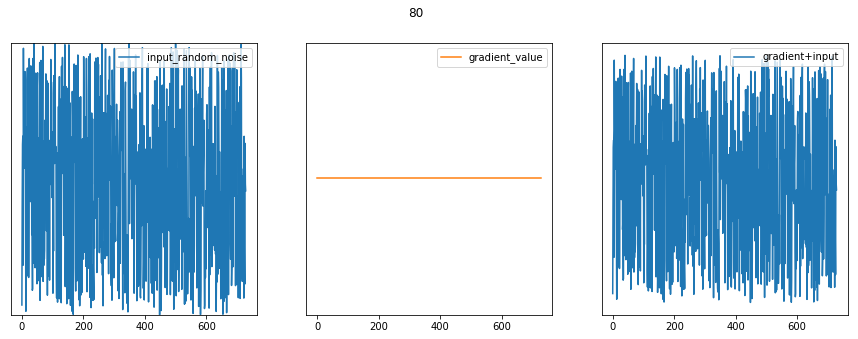

0.0
81


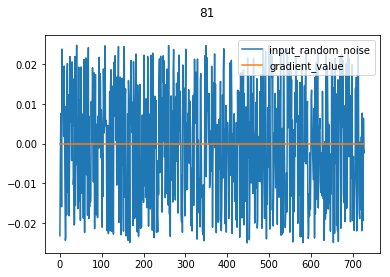

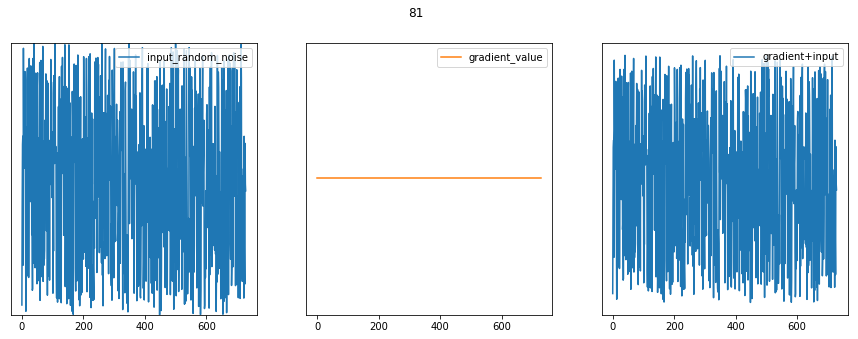

0.0
82


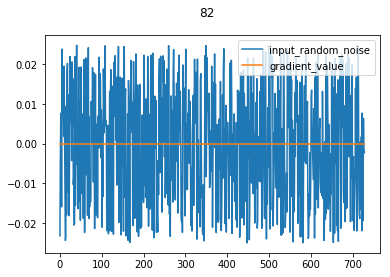

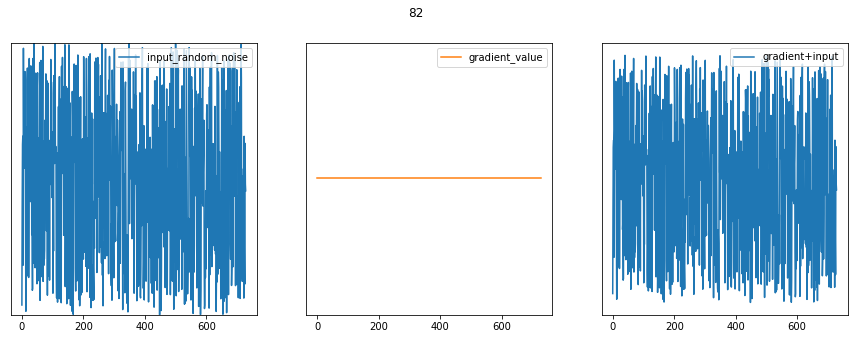

0.0
83


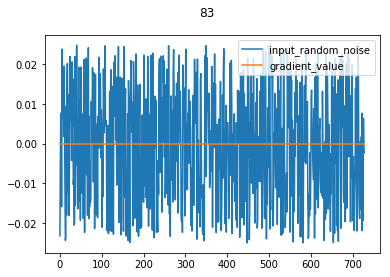

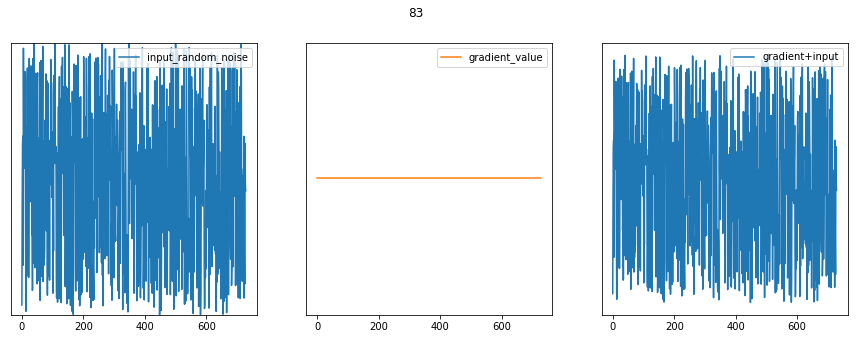

0.0
84


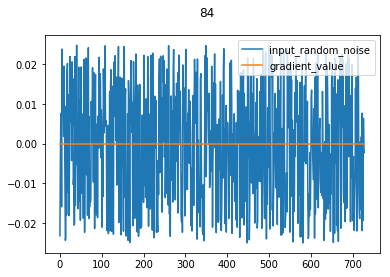

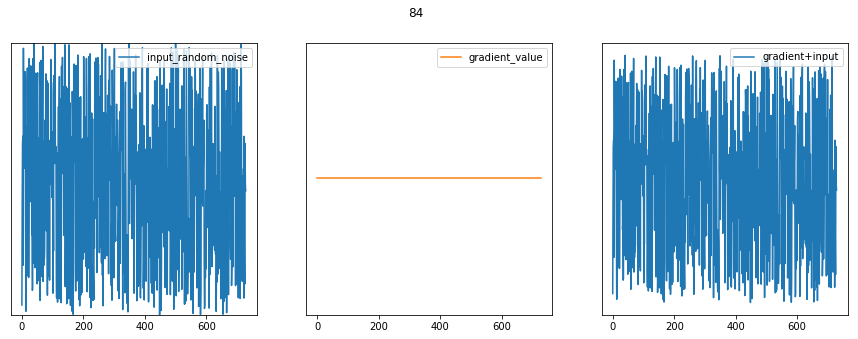

0.0
85


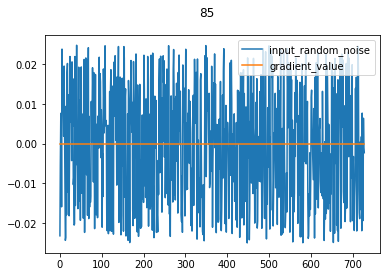

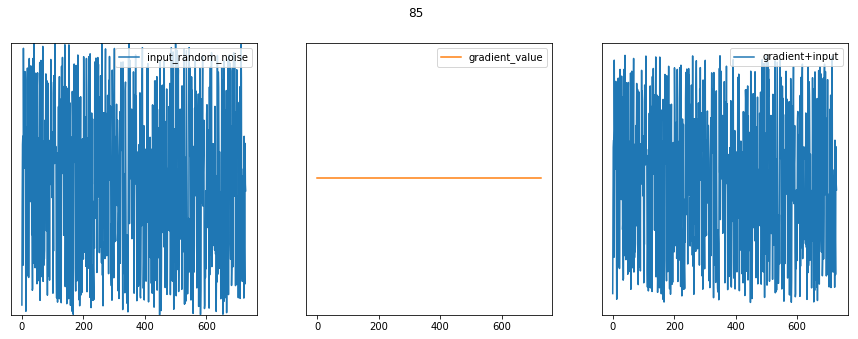

0.0
86


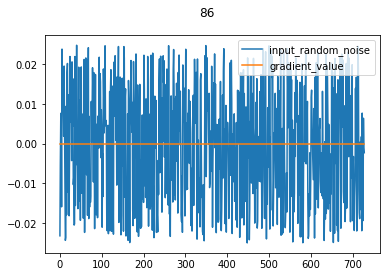

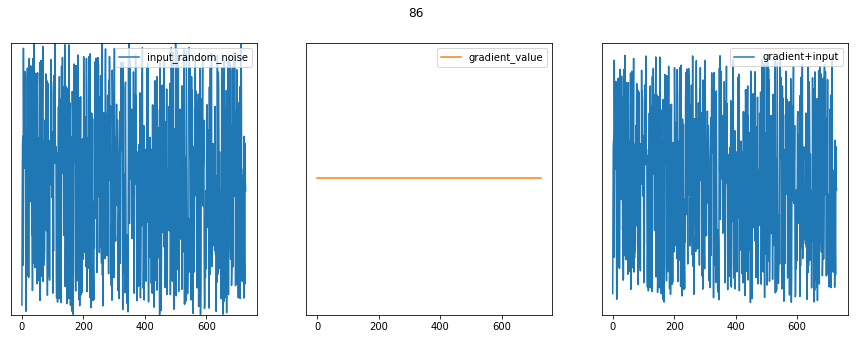

0.0
87


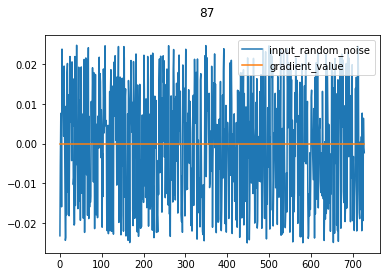

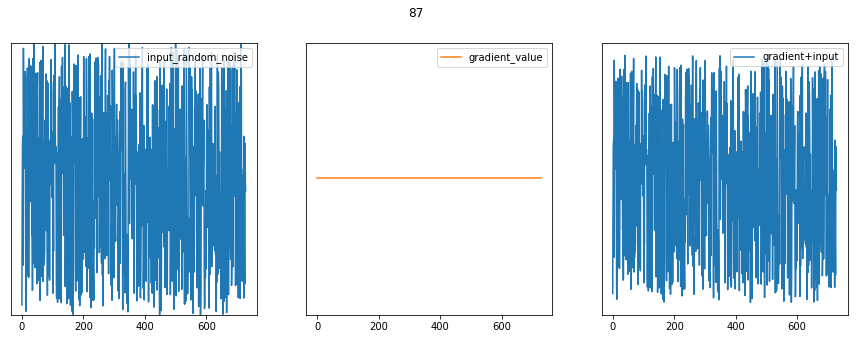

0.0
88


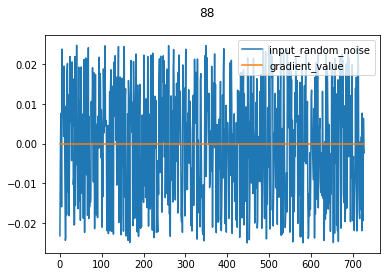

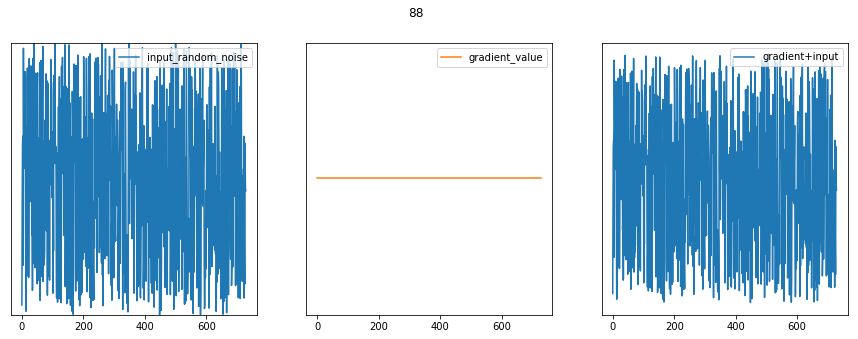

0.0
89


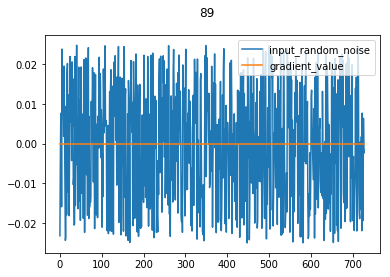

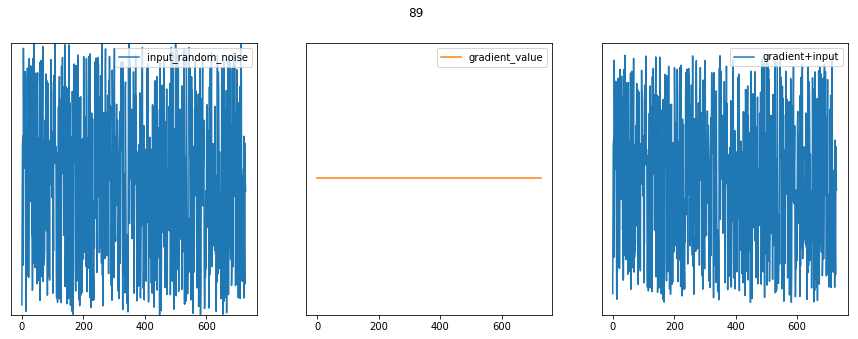

0.0
90


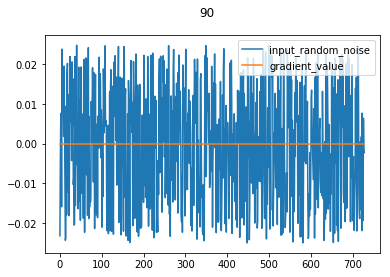

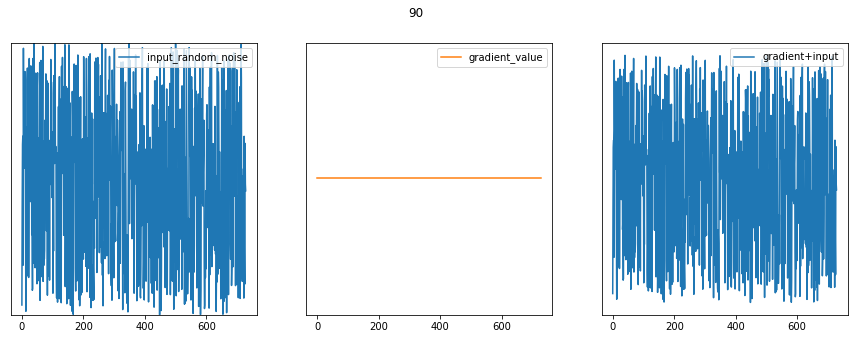

0.0
91


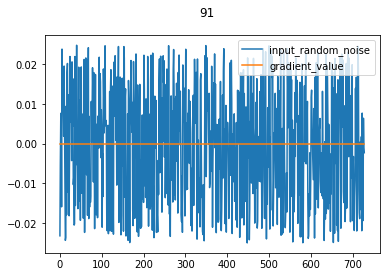

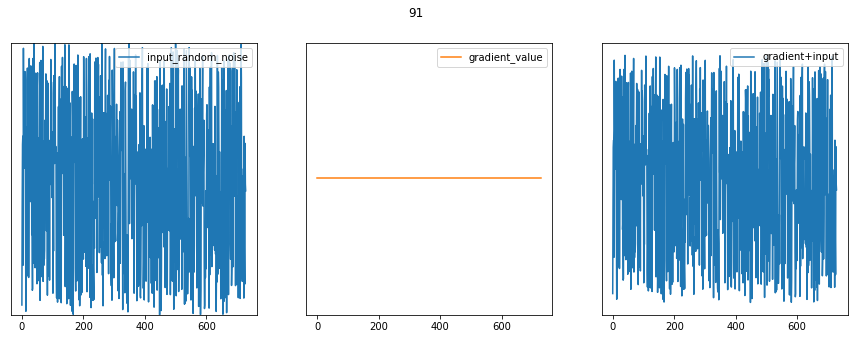

0.0
92


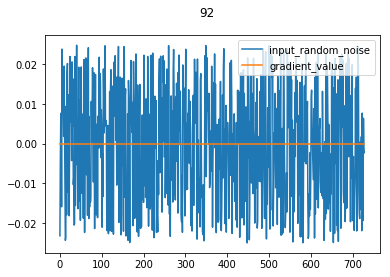

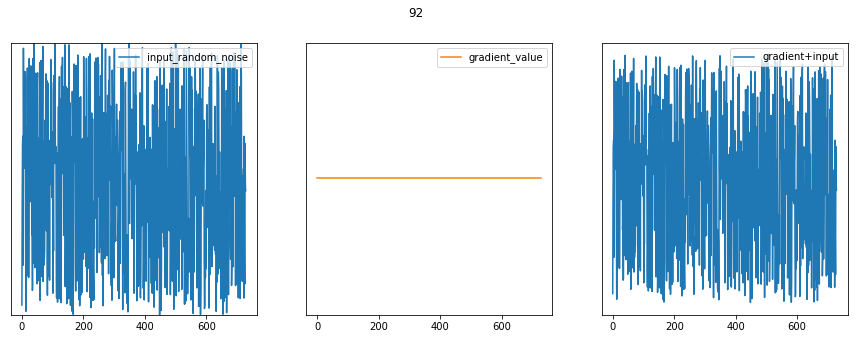

0.0
93


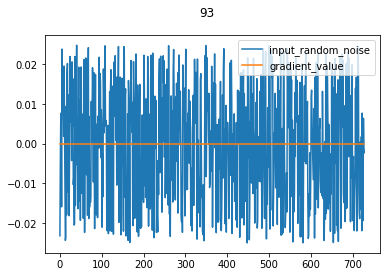

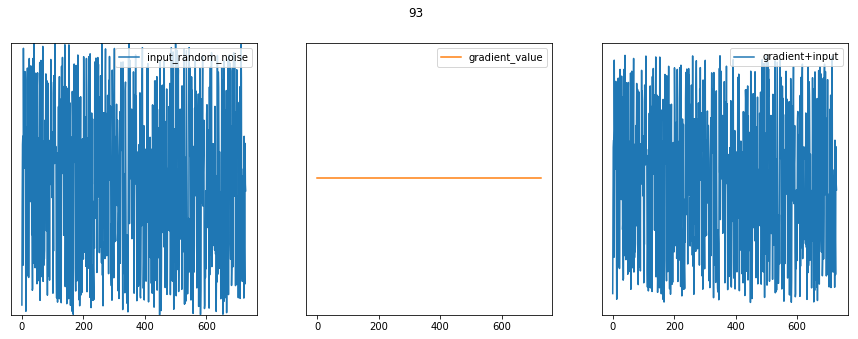

0.0
94


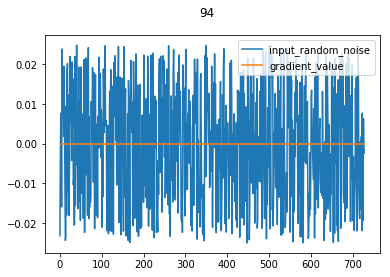

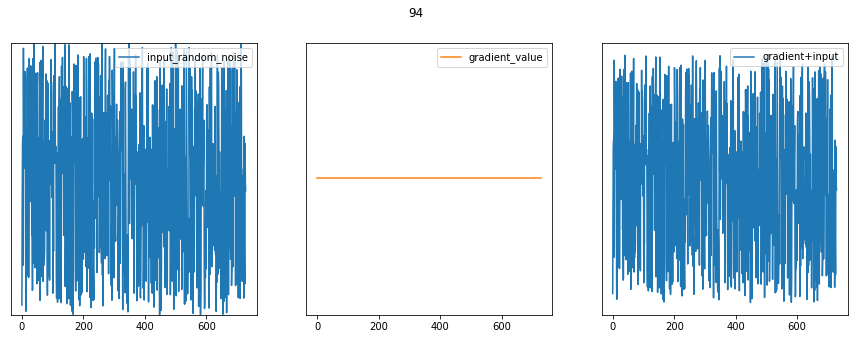

0.0
95


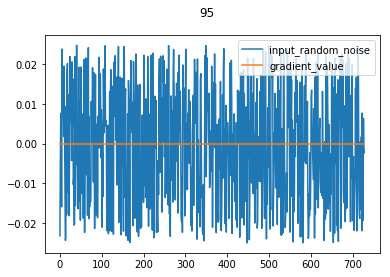

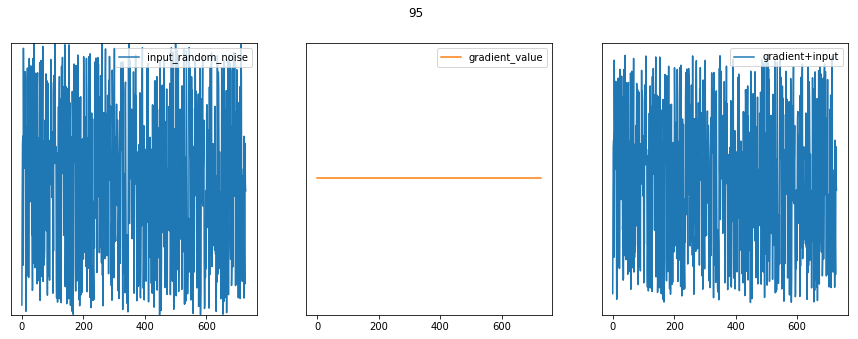

0.0
96


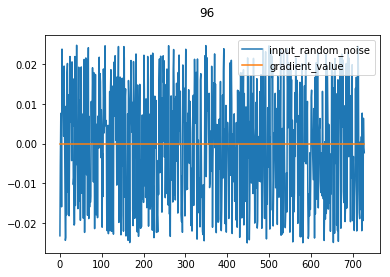

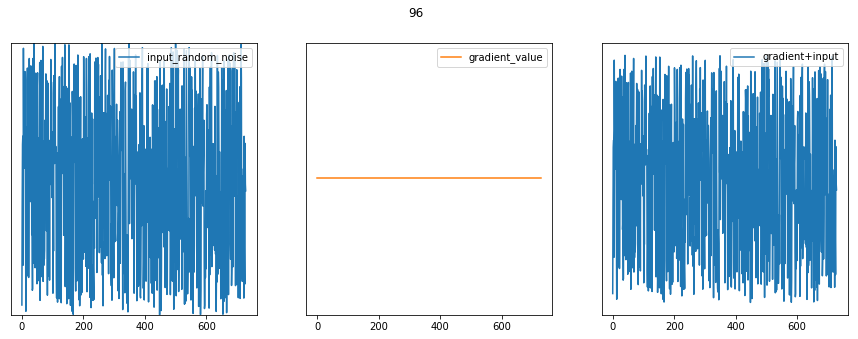

0.0
97


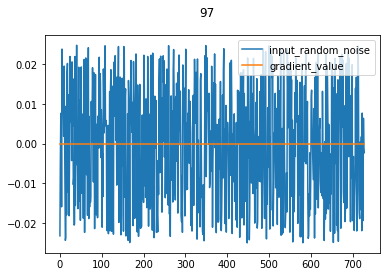

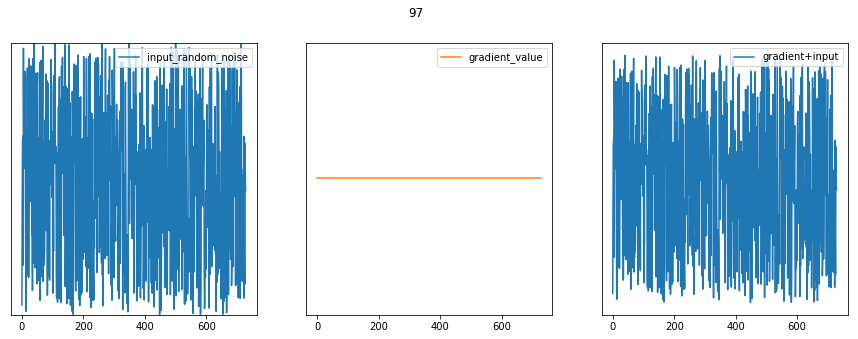

0.0
98


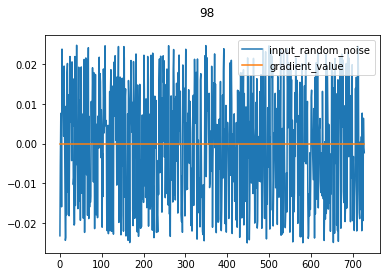

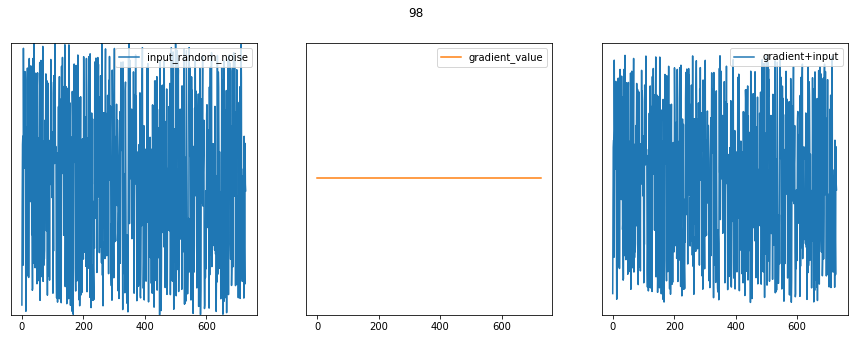

0.0
99


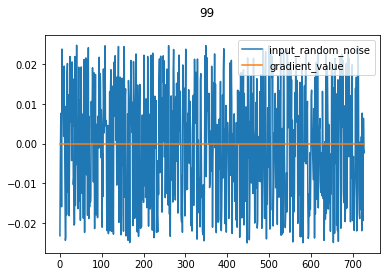

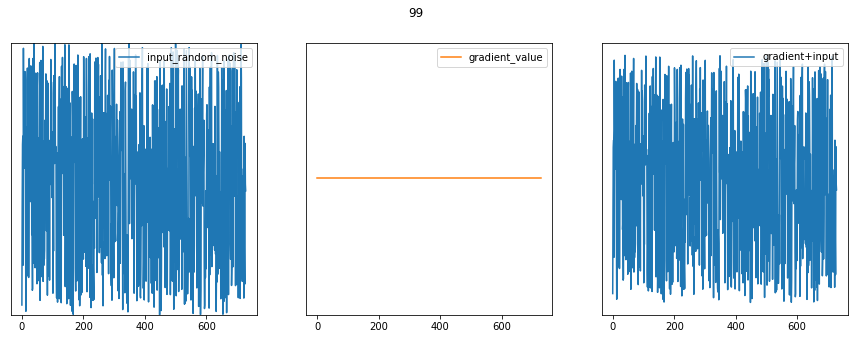

0.0


In [34]:
result = get_activation_maximization(model, 7, 1, output_dim=729, step=1, epochs=100)

In [101]:
result.max()

457.57926472758646

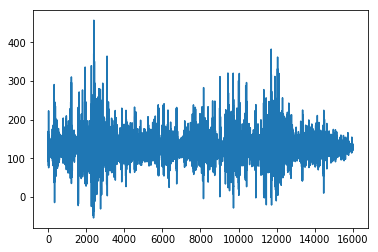

In [102]:
plt.figure()
plt.plot(result.squeeze())
plt.show()

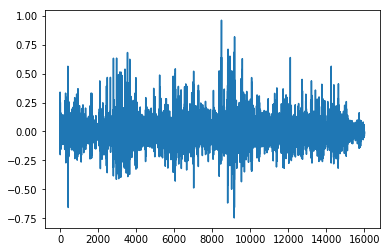

In [130]:
test = deprocess_wav(result.squeeze())
plt.figure()
plt.plot(test)
plt.show()

In [91]:
num_of_row

32.0

In [147]:
import IPython.display as ipd

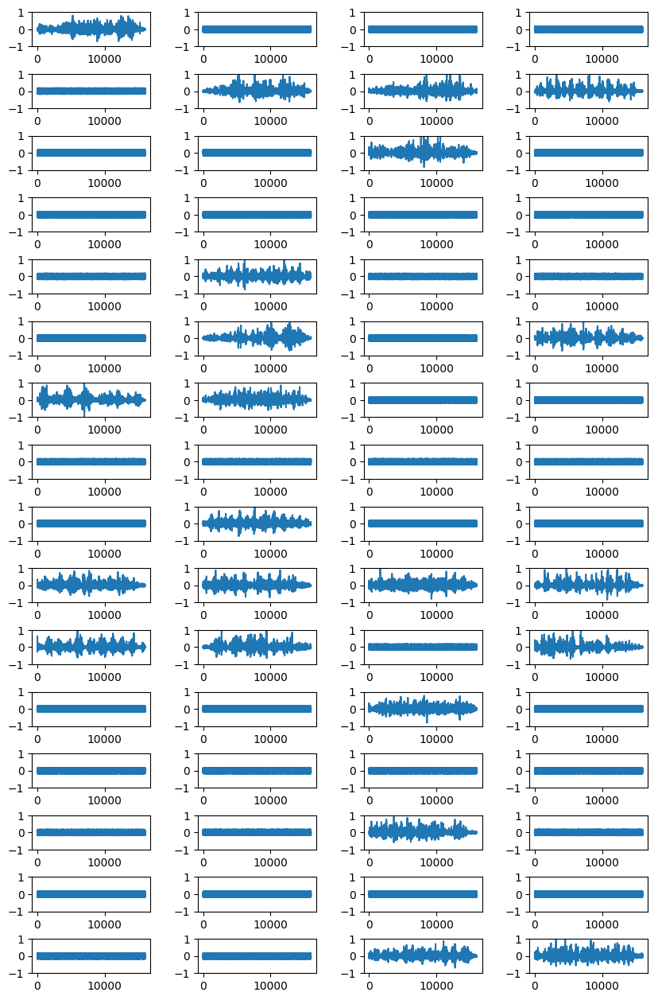

In [167]:
layer_index = 7
num_of_filter = 64

plot_per_row = 4
num_of_row = np.around(num_of_filter/plot_per_row)

fig = plt.figure(figsize=(10, 8*((layer_index//4)+1)), dpi=100)
plt.subplots_adjust(wspace=0.4, hspace=0.8)

# y_min = np.around(activation.min(), decimals=1)
# y_max = np.around(activation.max(), decimals=1)
y_min = -1
y_max = 1

for i in range(num_of_filter):
    plt.subplot(num_of_row, plot_per_row, i+1)
    result = get_activation_maximization(model, layer_index, i)
    result_wav = deprocess_wav(result.squeeze())
#     result = maxabs_scale(result)
    plt.ylim(y_min, y_max)
    plt.plot(result_wav)
    
    librosa.output.write_wav(
    output_path+'{}th_layer_{}th_filter.wav'.format(layer_index, str(i).zfill(3)), result_wav, sr)

plt.show()


--- Layer 1 ---


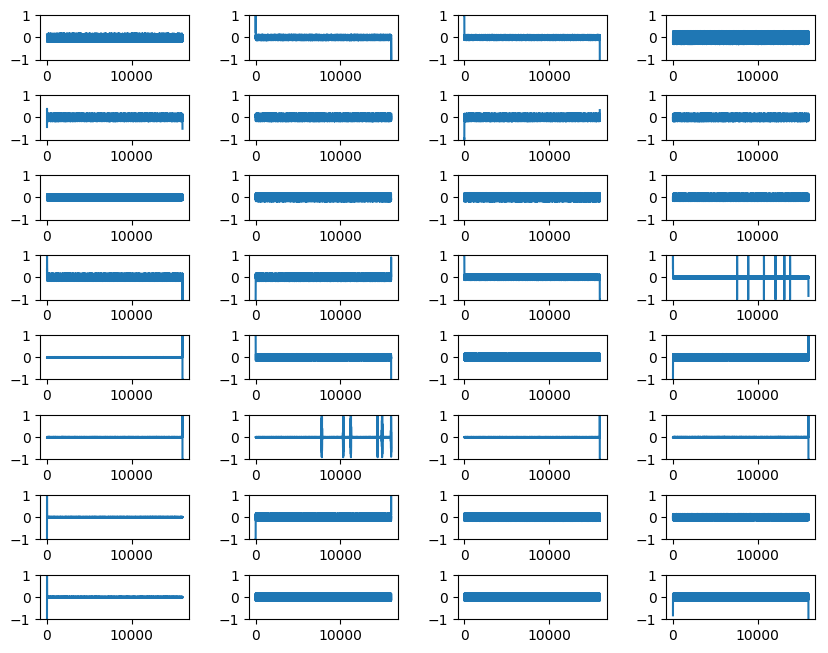


--- Layer 2 ---


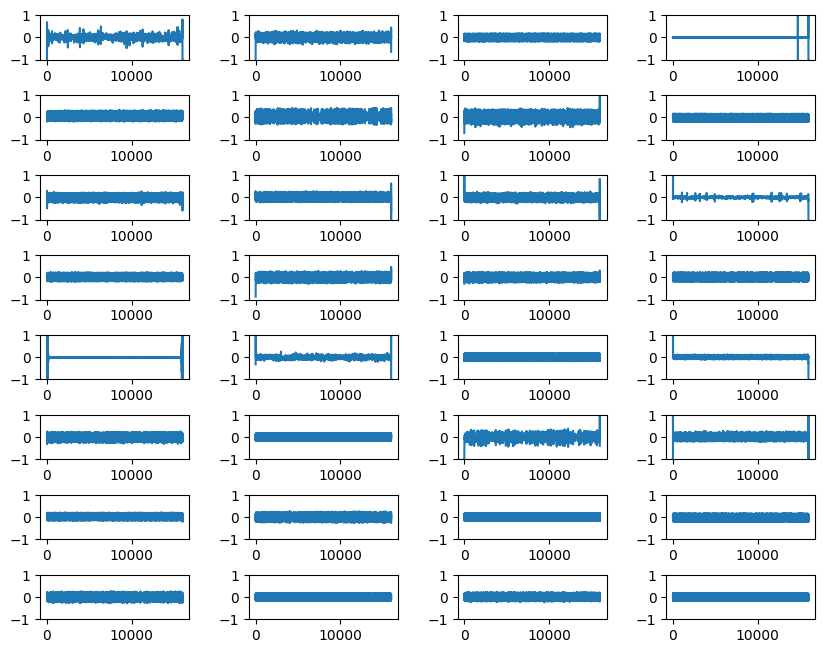


--- Layer 3 ---


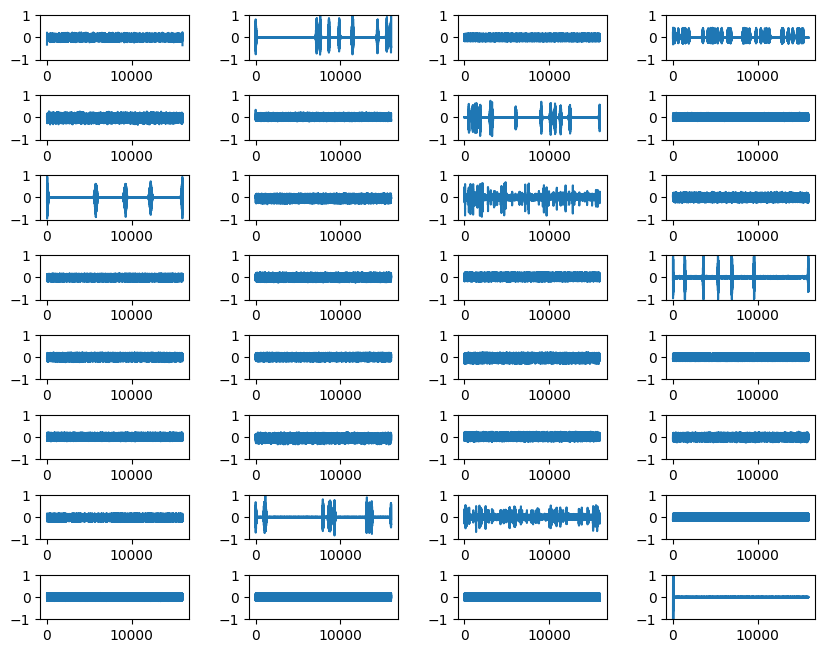


--- Layer 4 ---


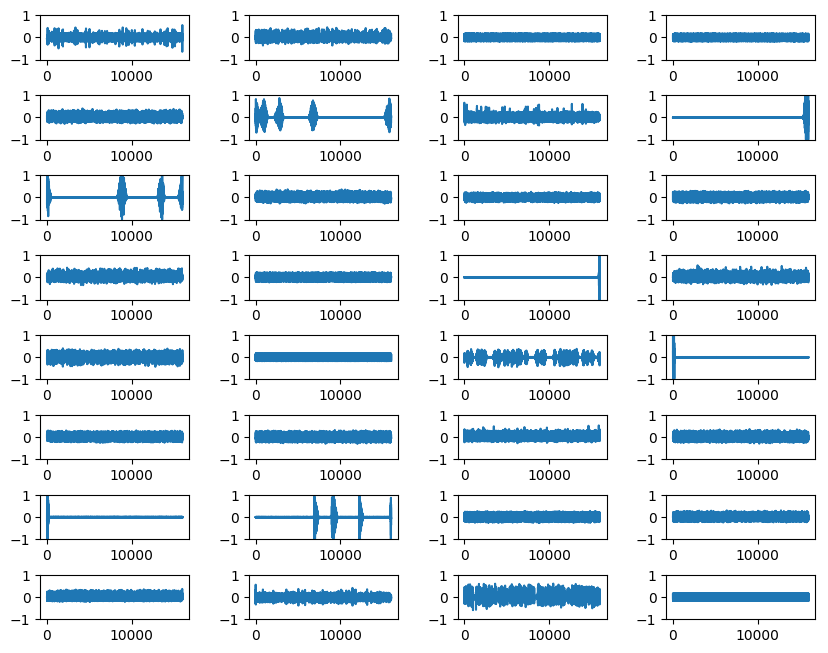


--- Layer 5 ---


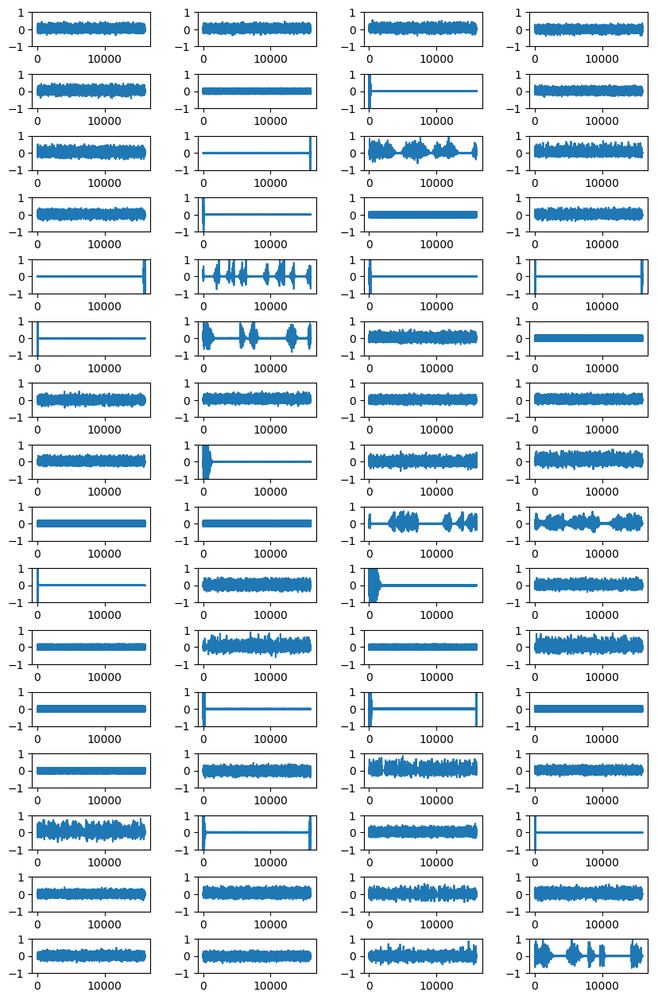


--- Layer 6 ---


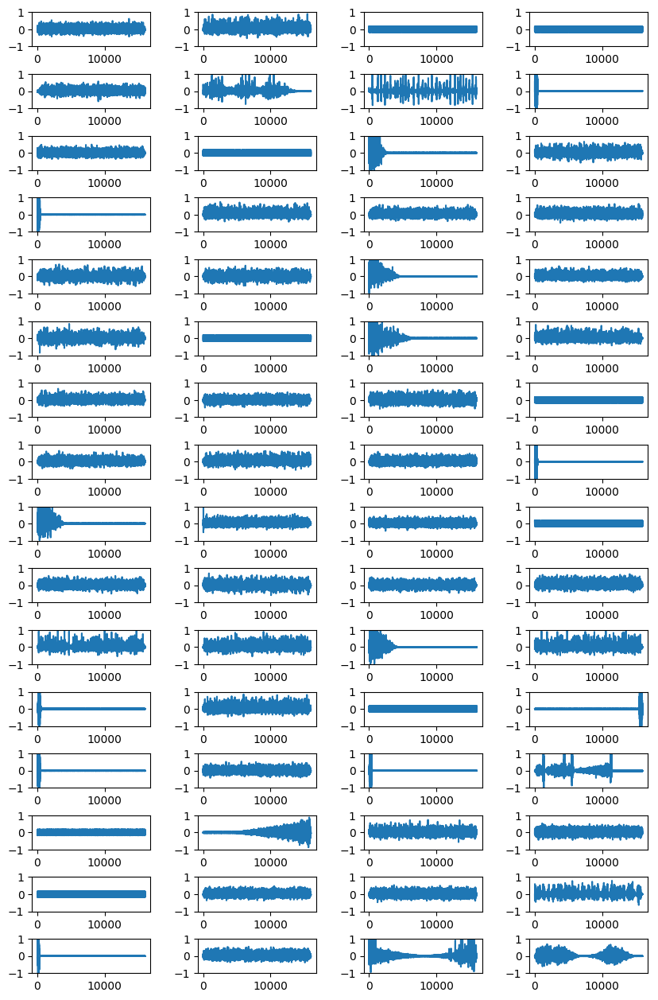


--- Layer 7 ---


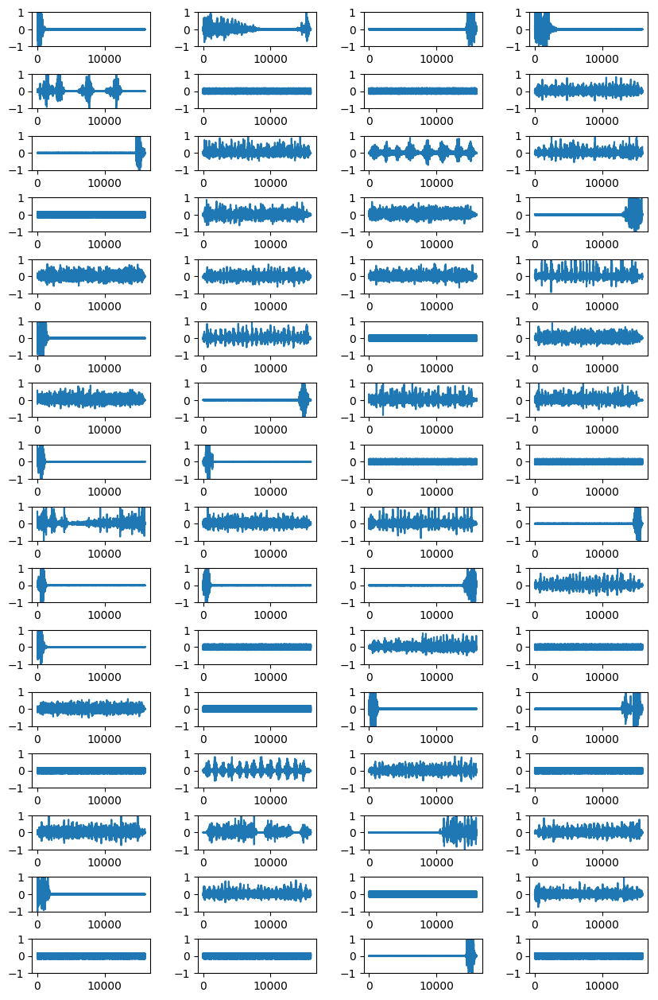


--- Layer 8 ---


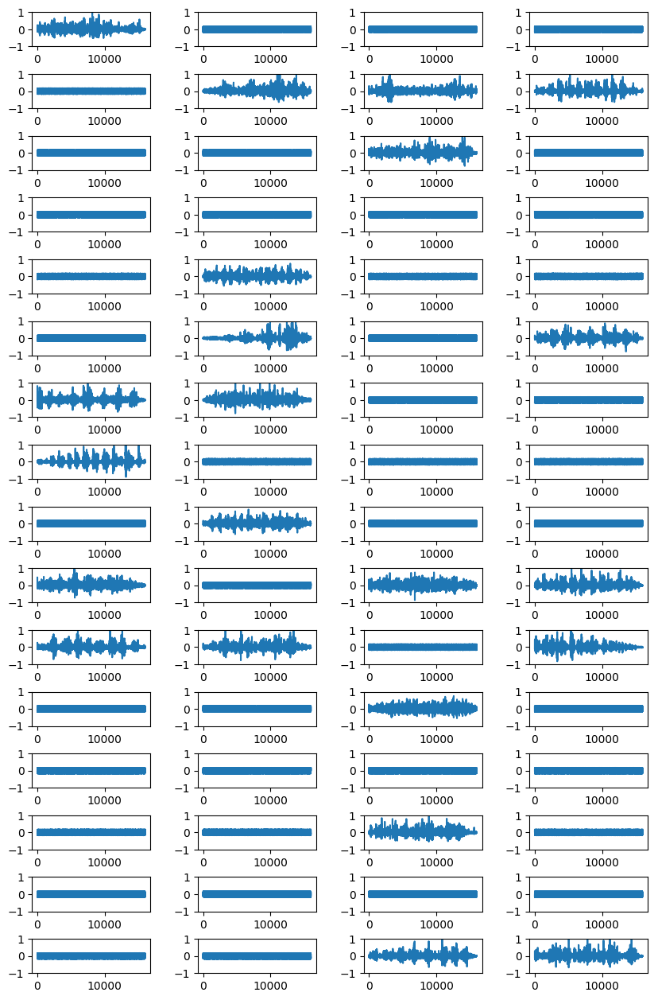

In [10]:
sr = 16000

# y_min = np.around(activation.min(), decimals=1)
# y_max = np.around(activation.max(), decimals=1)
y_min = -1
y_max = 1

output_path = 'maximization_audio/'
os.makedirs(output_path, exist_ok=True)
for layer_index in range(8):
    num_of_filter = 32*(2**int((layer_index)/4))
    
    plot_per_row = 4
    num_of_row = np.around(num_of_filter/plot_per_row)
    
    fig = plt.figure(figsize=(10, 8*((layer_index//4)+1)), dpi=100)
    plt.subplots_adjust(wspace=0.4, hspace=0.8)

    for i in range(num_of_filter):
        plt.subplot(num_of_row, plot_per_row, i+1)
        result = get_activation_maximization(model, layer_index, i)
        result_wav = deprocess_wav(result.squeeze())
    #     result = maxabs_scale(result)
        plt.ylim(y_min, y_max)
        plt.plot(result_wav)

        librosa.output.write_wav(
        output_path+'{}th_layer_{}th_filter.wav'.format(layer_index, str(i).zfill(3)), result_wav, sr)
    
    print()
    print('--- Layer {} ---'.format(layer_index+1))
    plt.show()

--- Layer 1 ---


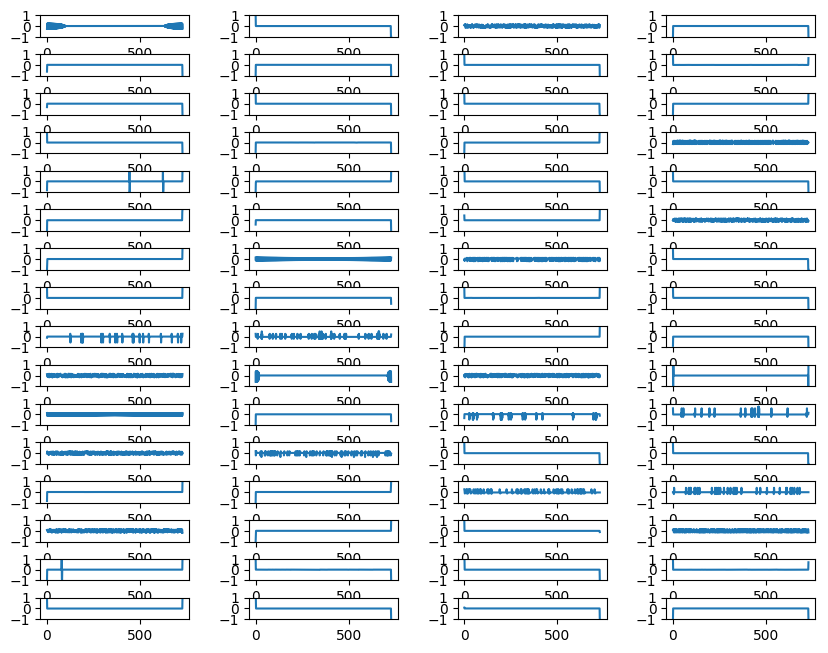


--- Layer 2 ---


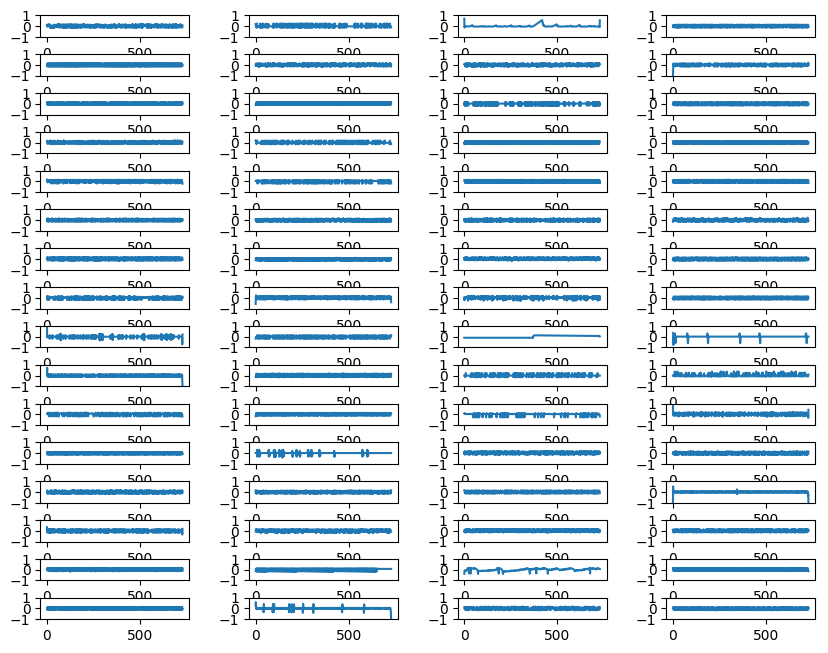


--- Layer 3 ---


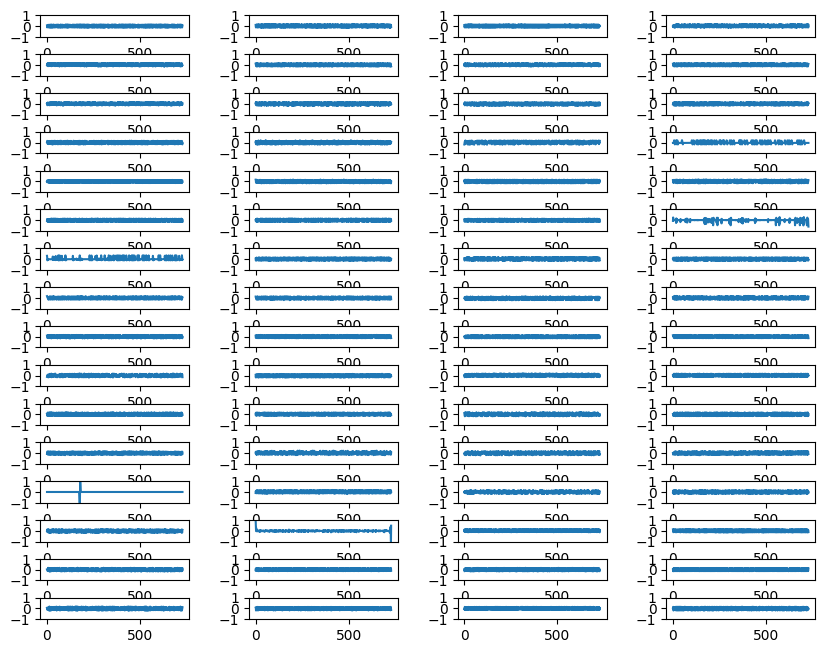


--- Layer 4 ---


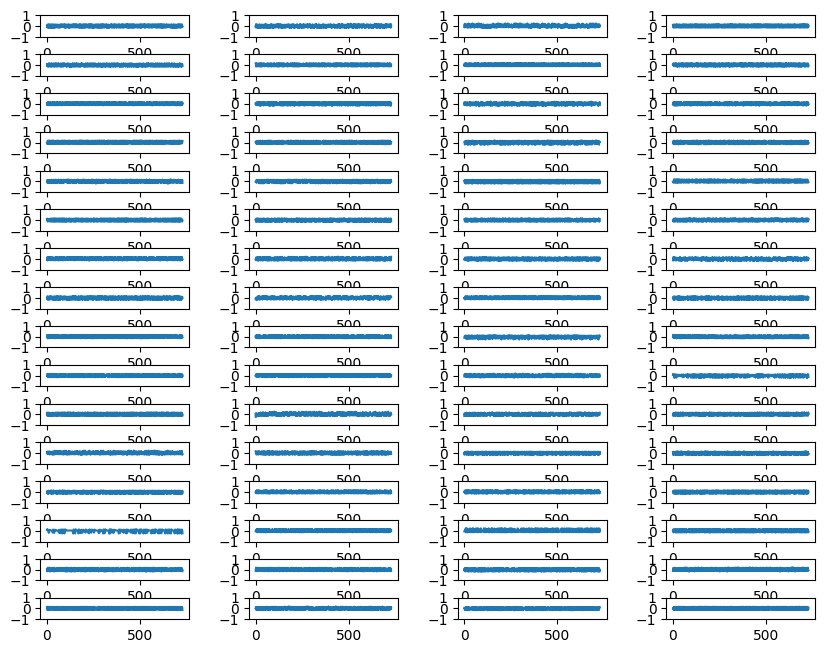


--- Layer 5 ---


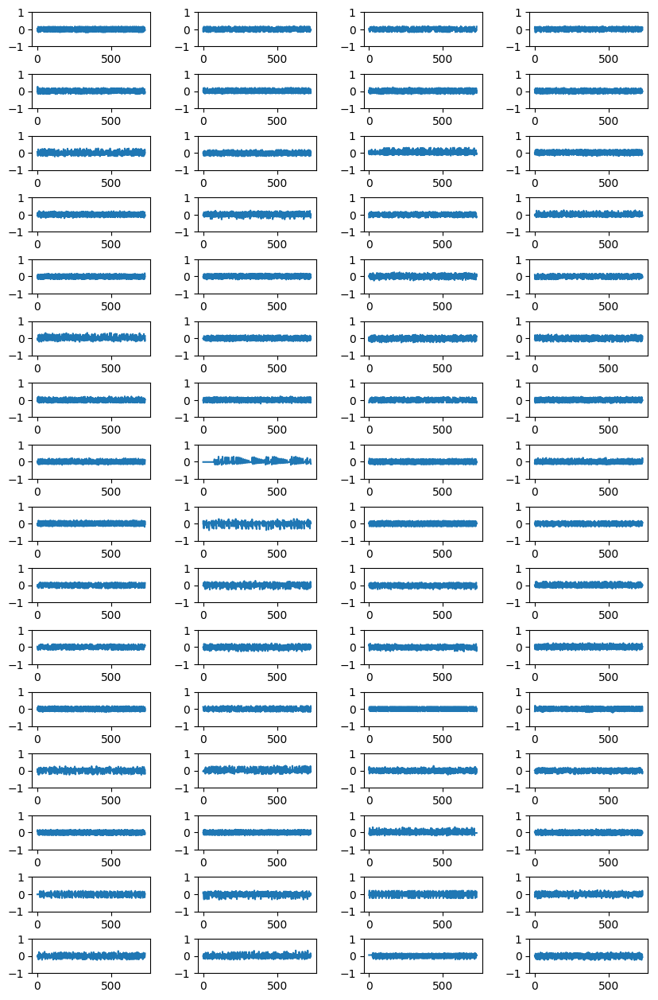


--- Layer 6 ---


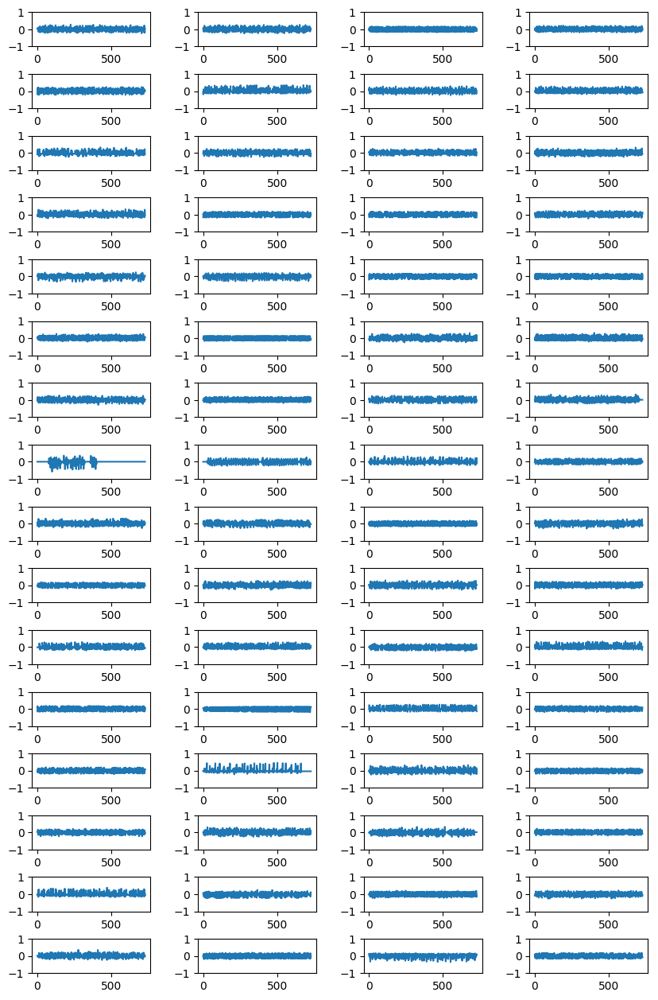


--- Layer 7 ---


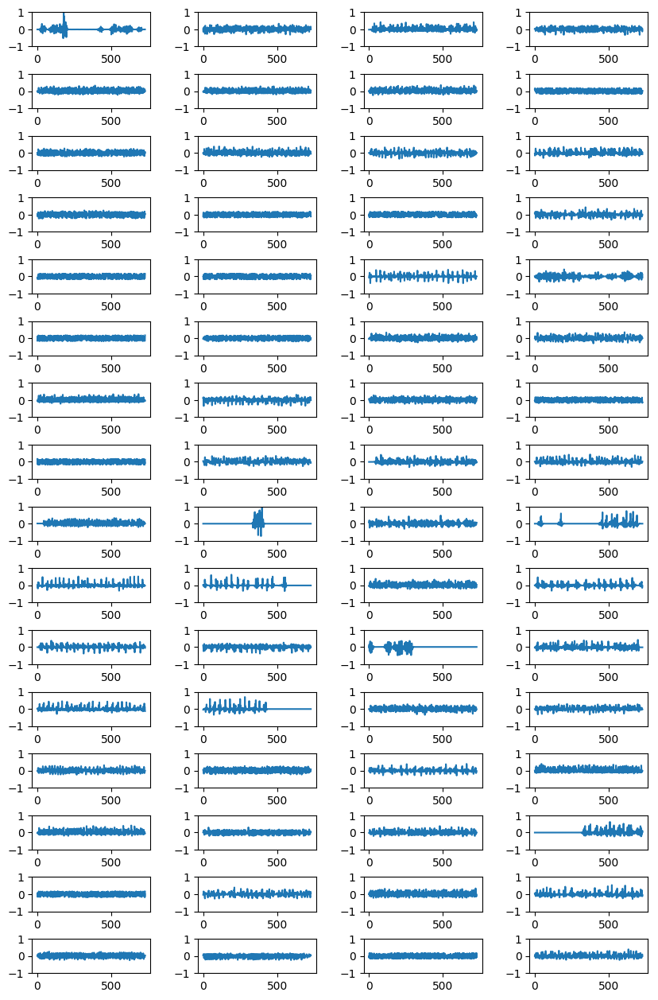


--- Layer 8 ---


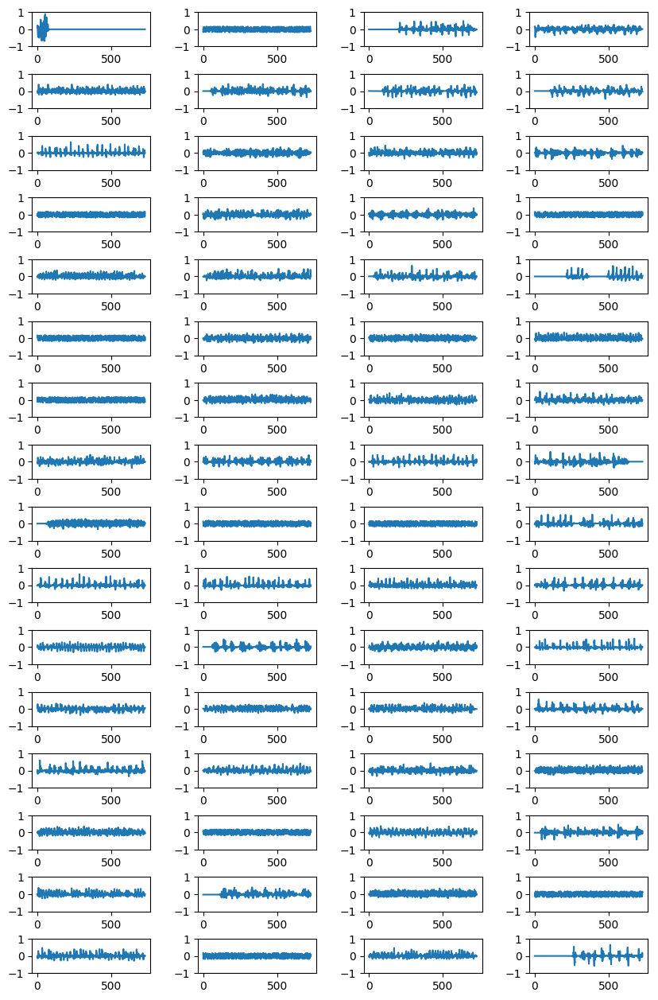


--- Layer 9 ---


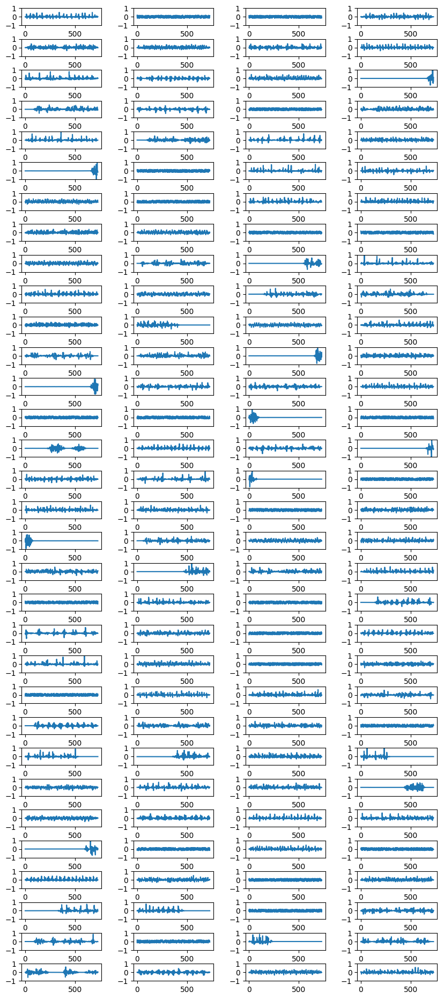


--- Layer 10 ---


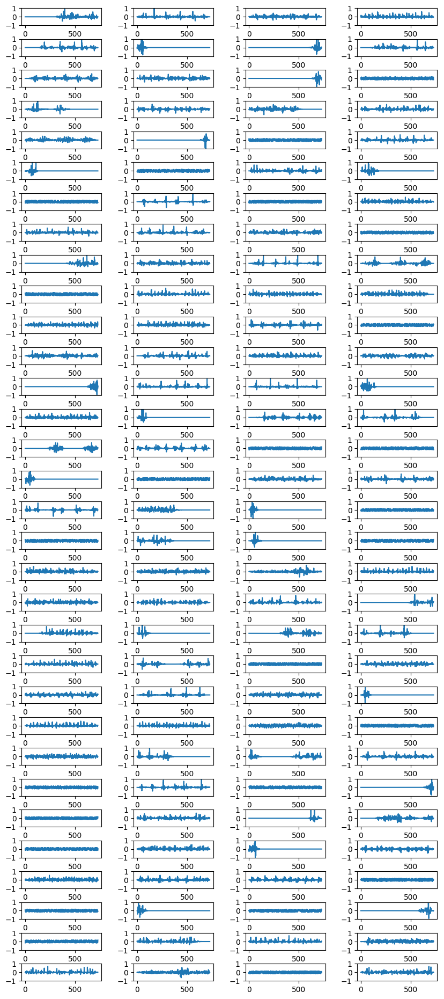


--- Layer 11 ---


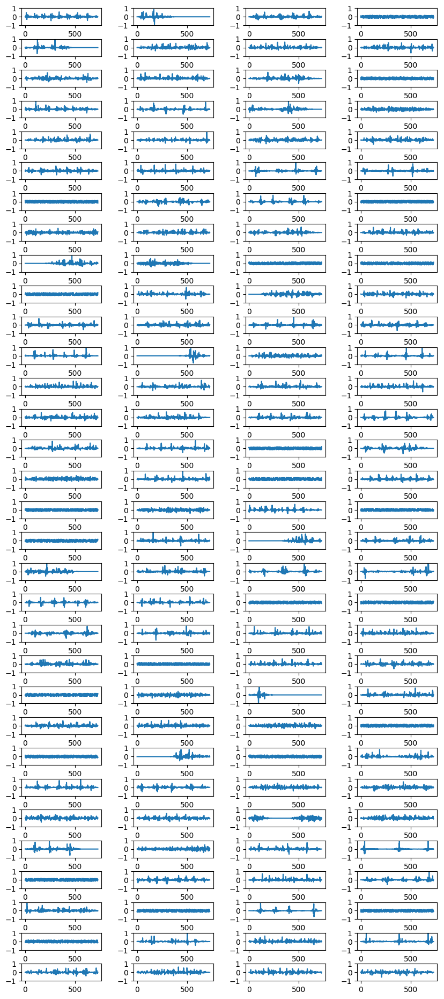

In [ ]:
y_min = -1
y_max = 1

output_path = 'visualization/1D_CNN_custom_conv_3_VGG_DO_075_DO/activation_maximization/process/'
os.makedirs(output_path, exist_ok=True)

for layer_index in range(16):
    num_of_filter = 64*(2**int((layer_index//2)/4))
    
    plot_per_row = 4
    num_of_row = np.around(num_of_filter/plot_per_row)
    
    fig = plt.figure(figsize=(10, 8*((layer_index//4)+1)), dpi=100)
    plt.subplots_adjust(wspace=0.4, hspace=0.8)

    for i in range(num_of_filter):
        plt.subplot(num_of_row, plot_per_row, i+1)
        result = get_activation_maximization(model, layer_index, i, 
                                             output_dim=729, step=1, epochs=1000)
        result_wav = deprocess_wav(result.squeeze())
        plt.ylim(y_min, y_max)
        plt.plot(result_wav)

    print('--- Layer {} ---'.format(layer_index+1))
    save_name = '1D_CNN_custom_conv_3_VGG_DO_075_DO_{}_layer'.format(layer_index+1) 
    plt.savefig(output_path+save_name)
    plt.show()
    print()

In [9]:
model.layers[-1].activation, model.layers[-1].output

(<function tensorflow.python.keras.activations.softmax(x, axis=-1)>,
 <tf.Tensor 'dense_2/Softmax:0' shape=(?, 16) dtype=float32>)

In [10]:
from tensorflow.keras import activations
from tensorflow.keras.models import load_model
import tempfile

model.layers[-1].activation = activations.linear
# model.layers[-1].activation = activations.relu

model_path = os.path.join(tempfile.gettempdir(), next(tempfile._get_candidate_names()) + '.h5')
try:
    model.save(model_path)
    model = load_model(model_path)
finally:
    os.remove(model_path)

In [11]:
model.layers[-1].activation, model.layers[-1].output

(<function tensorflow.python.keras.activations.linear(x)>,
 <tf.Tensor 'dense_2_1/BiasAdd:0' shape=(?, 16) dtype=float32>)

In [12]:
y_table[:,0]

array(['zero', 'one', 'two', 'three', 'four', 'five', 'six', 'seven',
       'eight', 'nine', 'bed', 'bird', 'cat', 'dog', 'house', 'tree'],
      dtype='<U5')

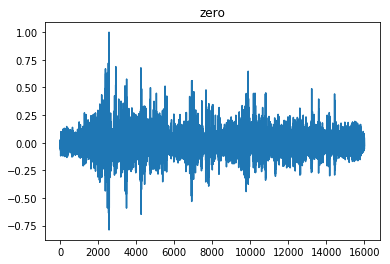

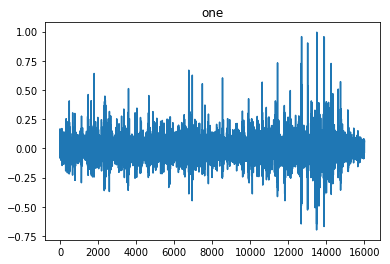

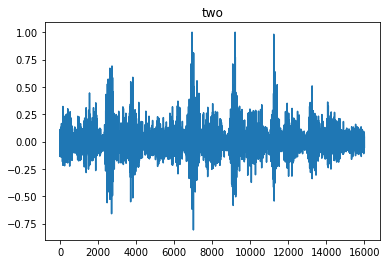

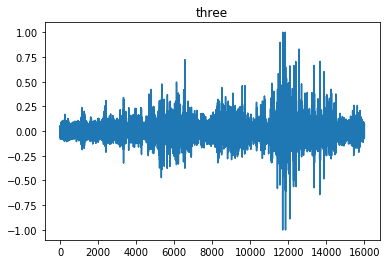

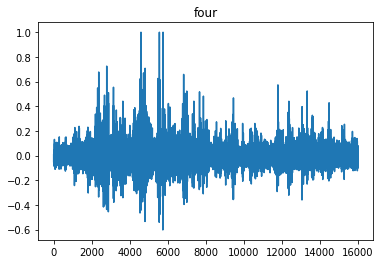

...

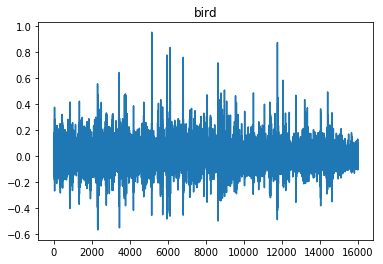

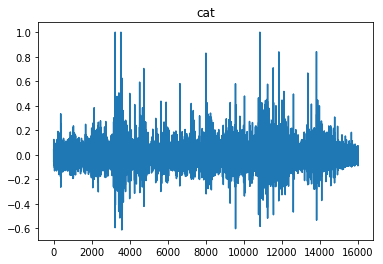

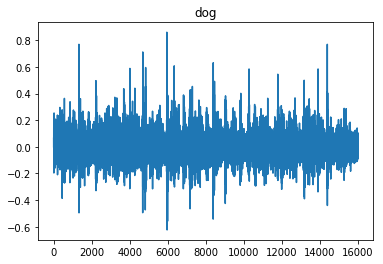

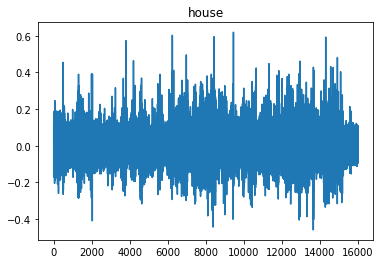

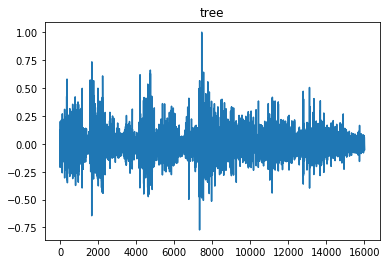

In [23]:
output_path = 'maximization_audio/'
os.makedirs(output_path, exist_ok=True)

for i, label in enumerate(y_table[:,0]):
    result = get_activation_maximization(model, -1, i, step=1, epochs=200)
    result = deprocess_wav(result.squeeze())
    plt.figure()
    plt.title(label)
    plt.plot(result)
    plt.save
    plt.show()
    librosa.output.write_wav(
        output_path+'output_layer_{}th_filter_{}.wav'.format(str(i).zfill(3), label), result, 16000)


In [ ]:
output_path = 'visualization/1D_CNN_custom_conv_3_VGG_DO_075_DO/activation_maximization/process/'
os.makedirs(output_path, exist_ok=True)

for i, label in enumerate(y_table[:,0]):
    result = get_activation_maximization(model, -1, i, step=1, epochs=1000)
    result = deprocess_wav(result.squeeze())
    plt.figure()
    plt.title(label)
    plt.plot(result)
    save_name = '1D_CNN_custom_conv_3_VGG_DO_075_DO_output_layer_{}'.format(label) 
    plt.savefig(output_path+save_name)
    plt.show()


In [ ]:
# output_path = 'maximization_audio/'
# os.makedirs(output_path, exist_ok=True)

for i, label in enumerate(y_table[:,0]):
    result = get_activation_maximization(model, -1, 1, step=1, epochs=500)
    result = deprocess_wav(result.squeeze())
    plt.figure()
    plt.title(label)
    plt.plot(result)
    plt.show()
#     librosa.output.write_wav(
#         output_path+'output_layer_{}th_filter_{}.wav'.format(str(i).zfill(3), label), result, 16000)



--- Layer 1 ---
(320, 365)

--- Layer 2 ---
(320, 365)

--- Layer 3 ---
(320, 365)

--- Layer 4 ---
(320, 365)

--- Layer 5 ---
(320, 365)

--- Layer 6 ---
(320, 365)

--- Layer 7 ---
(320, 365)

--- Layer 8 ---
(320, 365)

--- Layer 9 ---
(256, 365)

--- Layer 10 ---
(256, 365)

--- Layer 11 ---
(256, 365)

--- Layer 12 ---
(256, 365)

--- Layer 13 ---
(256, 365)

--- Layer 14 ---
(256, 365)

--- Layer 15 ---
(256, 365)

--- Layer 16 ---
(256, 365)


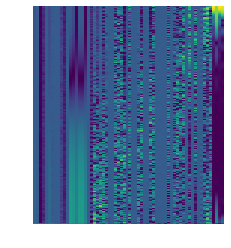

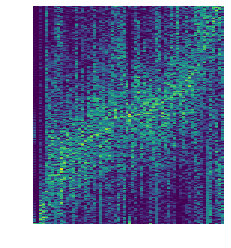

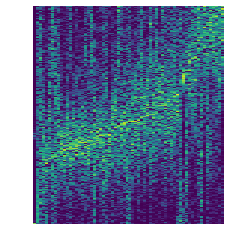

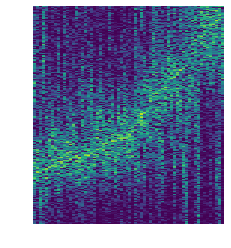

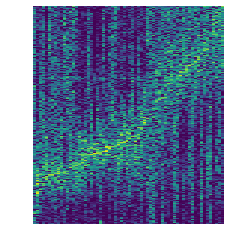

...

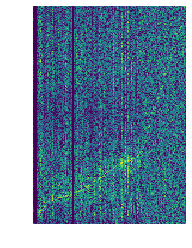

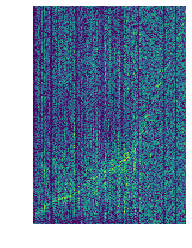

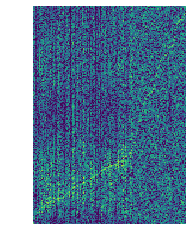

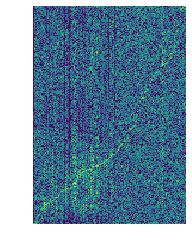

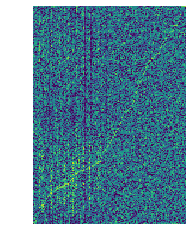

In [15]:
y_min = -1
y_max = 1

fft_size = 729

output_path = 'visualization/1D_CNN_custom_conv_3_VGG_DO_075_DO/activation_maximization/'
save_base_name = '1D_CNN_custom_conv_3_VGG_DO_075_DO'
os.makedirs(output_path, exist_ok=True)
for layer_index in range(16):
    num_of_filter = 64*(2**int((layer_index//2)/4))
    
    plt.figure()

    repetition = int((fft_size/2+1)/num_of_filter)
    
    fftzed = np.zeros((num_of_filter,int(fft_size/2+1)))
    for i in range(num_of_filter):
        result = get_activation_maximization(model, layer_index, i, 
                                             output_dim=fft_size, step=1, epochs=20)
        result = deprocess_wav(result.squeeze())
        
#         result = result - np.mean(result) # normalization
#         sample_lpf = butter_lowpass_filter(sample,cutoff,fs_ft,order)

#         plt.ylim(y_min, y_max)
#         plt.plot(result_wav)

#         librosa.output.write_wav(
#         output_path+'{}th_layer_{}th_filter.wav'.format(layer_index, str(i).zfill(3)), result_wav, sr)

        # perform squared magnitude spectra
        S = librosa.core.stft(result,n_fft=fft_size,
                              hop_length=fft_size+1,
                              win_length=fft_size)
        X = np.square(np.absolute(S))
        log_S = np.log10(1+10*X)
        log_S = np.squeeze(log_S.astype(np.float32))
        #log_S = np.mean(log_S,axis=1)
#         print(log_S.shape)
        fftzed[i] = log_S
        
    print()
    print('--- Layer {} ---'.format(layer_index+1))
    argmaxed = np.argmax(fftzed,axis=1)
    sort_idx = np.argsort(argmaxed)
    sorted_fft = fftzed[sort_idx,:]

    sorted_fft = np.repeat(sorted_fft,repetition,axis=0)
    print(sorted_fft.shape)

    # save figure
    plt.clf()
    plt.imshow(sorted_fft.T)
    plt.gca().invert_yaxis()
    plt.axis('off')
    save_name = save_base_name+'_{}_layer'.format(layer_index+1)
    plt.savefig(output_path+save_name)


--- Layer 1 ---
(320, 365)

--- Layer 2 ---
(320, 365)

--- Layer 3 ---
(320, 365)

--- Layer 4 ---
(320, 365)

--- Layer 5 ---
(320, 365)

--- Layer 6 ---
(320, 365)

--- Layer 7 ---
(320, 365)

--- Layer 8 ---
(320, 365)

--- Layer 9 ---
(256, 365)

--- Layer 10 ---
(256, 365)

--- Layer 11 ---
(256, 365)

--- Layer 12 ---
(256, 365)

--- Layer 13 ---
(256, 365)

--- Layer 14 ---
(256, 365)

--- Layer 15 ---
(256, 365)

--- Layer 16 ---
(256, 365)


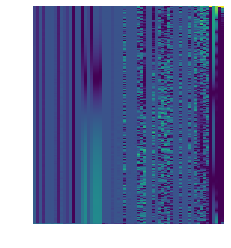

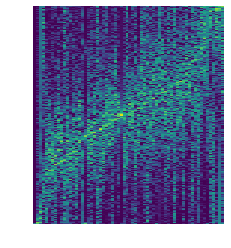

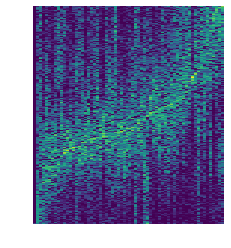

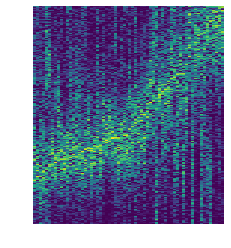

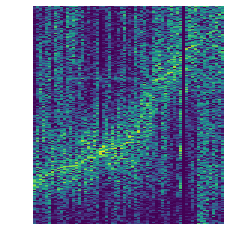

...

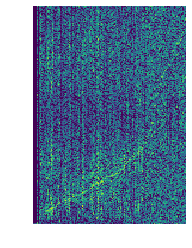

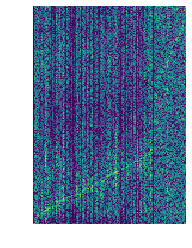

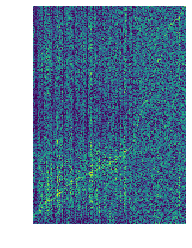

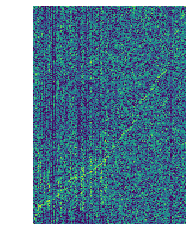

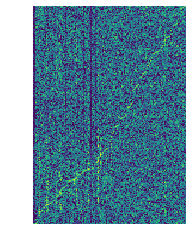

In [16]:
y_min = -1
y_max = 1

fft_size = 729

output_path = 'visualization/1D_CNN_custom_conv_3_VGG_DO_075_DO/activation_maximization/'
save_base_name = '1D_CNN_custom_conv_3_VGG_DO_075_DO'
os.makedirs(output_path, exist_ok=True)
for layer_index in range(16):
    num_of_filter = 64*(2**int((layer_index//2)/4))
    
    plt.figure()

    repetition = int((fft_size/2+1)/num_of_filter)
    
    fftzed = np.zeros((num_of_filter,int(fft_size/2+1)))
    for i in range(num_of_filter):
        result = get_activation_maximization(model, layer_index, i, 
                                             output_dim=fft_size, step=1, epochs=1000)
        result = deprocess_wav(result.squeeze())
        
#         result = result - np.mean(result) # normalization
#         sample_lpf = butter_lowpass_filter(sample,cutoff,fs_ft,order)

#         plt.ylim(y_min, y_max)
#         plt.plot(result_wav)

#         librosa.output.write_wav(
#         output_path+'{}th_layer_{}th_filter.wav'.format(layer_index, str(i).zfill(3)), result_wav, sr)

        # perform squared magnitude spectra
        S = librosa.core.stft(result,n_fft=fft_size,
                              hop_length=fft_size+1,
                              win_length=fft_size)
        X = np.square(np.absolute(S))
        log_S = np.log10(1+10*X)
        log_S = np.squeeze(log_S.astype(np.float32))
        #log_S = np.mean(log_S,axis=1)
#         print(log_S.shape)
        fftzed[i] = log_S
        
    print()
    print('--- Layer {} ---'.format(layer_index+1))
    argmaxed = np.argmax(fftzed,axis=1)
    sort_idx = np.argsort(argmaxed)
    sorted_fft = fftzed[sort_idx,:]

    sorted_fft = np.repeat(sorted_fft,repetition,axis=0)
    print(sorted_fft.shape)

    # save figure
    plt.clf()
    plt.imshow(sorted_fft.T)
    plt.gca().invert_yaxis()
    plt.axis('off')
    save_name = save_base_name+'_{}_layer'.format(layer_index+1)
    plt.savefig(output_path+save_name)

In [17]:
y_table

array([['zero', '0'],
       ['one', '1'],
       ['two', '2'],
       ['three', '3'],
       ['four', '4'],
       ['five', '5'],
       ['six', '6'],
       ['seven', '7'],
       ['eight', '8'],
       ['nine', '9'],
       ['bed', '10'],
       ['bird', '11'],
       ['cat', '12'],
       ['dog', '13'],
       ['house', '14'],
       ['tree', '15']], dtype='<U5')